# Analyses of extremes

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import sys
import os
import seaborn as sns
from scipy.stats import linregress
from scipy import stats
from dask import delayed
from IPython.display import display, HTML
import imageio
#from joblib import Parallel, delayed
import matplotlib.dates as mdates
import intake
from DV8_extremes import *
#DV8_functions(1) packages
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.animation import FFMpegWriter
from matplotlib import animation, rc
from IPython.display import HTML
#my functions:


import matplotlib.colors as mcolors

from tempfile import TemporaryDirectory
from getpass import getuser
from pathlib import Path
import dask
from dask.distributed import Client, LocalCluster
import bokeh
import subprocess
import re

import warnings
#warnings.filterwarnings('ignore')
scratch_dir = Path('/scratch') / getuser()[0] / getuser()

In [2]:


dask.config.config.get('distributed').get('dashboard').update({'link':'{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'})
cluster = LocalCluster(n_workers=32,threads_per_worker=1)
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/b382616/levante-spawner-advanced//proxy/8787/status,
Dashboard: /user/b382616/levante-spawner-advanced//proxy/8787/status,Workers: 32
Total threads: 32,Total memory: 250.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40843,Workers: 32
Dashboard: /user/b382616/levante-spawner-advanced//proxy/8787/status,Total threads: 32
Started: Just now,Total memory: 250.00 GiB
Comm: tcp://127.0.0.1:42561,Total threads: 1
Dashboard: /user/b382616/levante-spawner-advanced//proxy/42273/status,Memory: 7.81 GiB
Nanny: tcp://127.0.0.1:34783,


2025-12-02 19:34:08,761 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 3fe7de4497eeb2501e0500b63c9112b4 initialized by task ('getitem-open_dataset-rechunk-transfer-d70c12656d366f82eeb622a2a2dfcaf4', 0, 0, 0, 30, 0, 0) executed on worker tcp://127.0.0.1:46521
2025-12-02 19:34:23,728 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 3fe7de4497eeb2501e0500b63c9112b4 deactivated due to stimulus 'task-finished-1764700463.7272089'
2025-12-02 19:34:24,084 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 3fe7de4497eeb2501e0500b63c9112b4 initialized by task ('getitem-open_dataset-rechunk-transfer-d70c12656d366f82eeb622a2a2dfcaf4', 0, 0, 0, 30, 0, 0) executed on worker tcp://127.0.0.1:42863
2025-12-02 19:34:38,555 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 3fe7de4497eeb2501e0500b63c9112b4 deactivated due to stimulus 'task-finished-1764700478.5549107'
2025-12-02 19:34:39,179 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle bb1dc380ae73

# LOAD DATA
### Only take latitudes between 50°S and 70°N, to retain only ice-free oceans. To make sure no sea ice appears in these latitudes we apply SSTA=SSTA.where(sst>-1.7) for all anomalies. Gridcells with sea ice are defined in OSTIA,ICON and IFS-FESOM as an SST value of ~-1.75, by applying the where condition we make sure to only take ice free times and grid-cells without throwing out entire areas, but only the times and places where sea ice appears.
### Convert ICON and IFS-FESOM longitudes from 0->360 to -180->180

In [3]:

def lon_180w_180e(ds_sice: xr.DataArray):
    ds_sice = (
        ds_sice
        .assign_coords(lon=lambda x: (x.lon - 180) % 360 - 180)
        .sortby('lon'))

    return ds_sice

In [4]:
#SST

# OSTIA
filename='/scratch/b/b382615/mhws/ostia.zarr' 
sst = xr.open_zarr(str(filename), chunks={'time':150, 'lat':-1, 'lon':-1}).sst
sst=sst.sel(lat=slice(-50, 70))
sst=sst-273.15

# ICON HISTORICAL
cat = intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")
dat = cat['dkrz.disk.model-output.icon-esm-er.hist-1950.v20240618.ocean.gr025']
sst_ic = dat['2d_daily_mean'](chunks={}).to_dask().to.isel(depth=0).drop_vars('depth').chunk({'time':150, 'lat':-1, 'lon':-1})
sst_ic=sst_ic.sel(lat=slice(-50, 70))


# IFS FESOM
cat = intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")
dat = cat['dkrz.disk.model-output.ifs-fesom2-sr.hist-1950.v20240304.ocean.gr025']#.icon-esm-er.hist-1950.v20240618.ocean.gr025']
sst_f = dat['2D_daily_avg_1950-2014'].to_dask().avg_tos.isel(depth=0).drop_vars('depth').chunk({'time':150, 'lat':-1, 'lon':-1})
sst_f=sst_f.sel(lat=slice(-50, 70))
            


## SHIFTING BASELINE

In [5]:
##OSTIA extremes shifting baseline

#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_shift_hob_maxanom5.zarr'

#chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#ds = xr.open_zarr(str(file_name), chunks=chunks)
#ds = ds.sel(lat=slice(-50, 70))
#o_ex_s=ds['extreme_events']
#sst=sst.sel(time=slice((o_ex_s.time[0].values),str(o_ex_s.time[-1].values)))





##ICON HIST extremes shifting baseline

#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_shift_hob_maxanom5_oct25.zarr'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#i_ds = xr.open_zarr(str(file_name), chunks=chunks)
#i_ds=lon_180w_180e(i_ds)
#i_ds = i_ds.sel(lat=slice(-50, 70))
#i_ex_s=i_ds['extreme_events']
#sst_ic=sst_ic.sel(time=slice(str(i_ex_f.time[0].values),str(i_ex_f.time[-1].values)))
#i_ex_float = i_ex_s.astype(float)  # Convert to 0.0 and 1.0
#i_ex_s = i_ex_float > 0.5  # Convert back to boolean if needed




##IFS-FESOM extremes shifting baseline

#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IFSFESOMhist_pre_1982_2014_shift_hob_maxanom5_oct25.zarr'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#f_ds = xr.open_zarr(str(file_name), chunks=chunks)
#f_ds=lon_180w_180e(f_ds)
#f_ds = f_ds.sel(lat=slice(-50, 70))
#f_ex_s=f_ds['extreme_events']
#fssta=f_ds['dat_anomaly']
#f_ex_float = f_ex_s.astype(float) 
#f_ex_s = f_ex_float > 0.5  # Convert back to boolean if needed



## FIXED BASELINE

In [6]:
# FIXED BASELINES

# OSTIA EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_FixedDetrend_hob_oct25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
ds = xr.open_zarr(str(file_name), chunks=chunks)
ds = ds.sel(lat=slice(-50, 70))
o_ex=ds['extreme_events']
sst=sst.sel(time=slice((o_ex.time[0].values),str(o_ex.time[-1].values)))



In [7]:

# ICON HIST EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
i_ds = xr.open_zarr(str(file_name), chunks=chunks)
i_ds=lon_180w_180e(i_ds)
i_ds = i_ds.sel(lat=slice(-50, 70))
i_ex=i_ds['extreme_events']
sst_ic=sst_ic.sel(time=slice(str(i_ex.time[0].values),str(i_ex.time[-1].values)))


# For extreme events (boolean)
i_ex_float = i_ex.astype(float)  # Convert to 0.0 and 1.0
#i_ex_interp = i_ex_float.interp(lat=o_ex.lat, lon=o_ex.lon)
i_ex = i_ex_float > 0.5  # Convert back to boolean if needed





# IFS-FESOM EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
f_ds = xr.open_zarr(str(file_name), chunks=chunks)
f_ds=lon_180w_180e(f_ds)
f_ds = f_ds.sel(lat=slice(-50, 70))
f_ex=f_ds['extreme_events']
fssta=f_ds['dat_anomaly']
#sst_f=sst_f.sel(time=slice((fssta.time[0].values),str(fssta.time[-1].values)))
# For extreme events (boolean)
f_ex_float = f_ex.astype(float)  # Convert to 0.0 and 1.0
#f_ex_interp = f_ex_float.interp(lat=o_ex.lat, lon=o_ex.lon)
f_ex = f_ex_float > 0.5  # Convert back to boolean if needed



In [8]:
# SST ANOMALIES
# FIXED BASELINES


# FIXED BASELINES

# OSTIA ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_FixedDetrend_hob_oct25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
ds = xr.open_zarr(str(file_name), chunks=chunks)
ds = ds.sel(lat=slice(-50, 70))
ossta=ds['dat_anomaly']
sst=sst.sel(time=slice((ossta.time[0].values),str(ossta.time[-1].values))) #making sure SST time matches SSTA time before masking the sea ice
ossta=ossta.where(sst>-1.7) #remove from anomalies places and times where there is sea ice



# ICON HIST ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
i_ds = xr.open_zarr(str(file_name), chunks=chunks)
i_ds=lon_180w_180e(i_ds)
sst_ic=lon_180w_180e(sst_ic)
i_ds = i_ds.sel(lat=slice(-50, 70))
issta=i_ds['dat_anomaly']
sst_ic=sst_ic.sel(time=slice(str(issta.time[0].values),str(issta.time[-1].values)))
# Now apply the sea ice mask
issta = issta.where(sst_ic > -1.7)



# IFS-FESOM ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
f_ds = xr.open_zarr(str(file_name), chunks=chunks)
f_ds=lon_180w_180e(f_ds)
sst_f=lon_180w_180e(sst_f)
f_ds = f_ds.sel(lat=slice(-50, 70))
fssta=f_ds['dat_anomaly']
sst_f=sst_f.sel(time=slice((fssta.time[0].values),str(fssta.time[-1].values)))
# Now apply the sea ice mask
fssta = fssta.where(sst_f > -1.7)


# Regional masks
Create regional masks based on SST variance relevance. You have to download the oceanic regions from the shapefile at

Flanders Marine Institute (2021). Global Oceans and Seas, version 1. Available online at https://www.marineregions.org/. https://doi.org/10.14284/542.


Put this file in the same place as your shapefile_path. This file is then heavily modified to  adapt it to the wanted regions.

The 'create_oceanic_regions_mask' function needs a one-time slice of global sst to work.

You have to provide an example_sst for each model (if they have different grids) for the oceanic regions masks to be created: Any single time slice of lat and lon will work.

if you don't specify it in the funbction call here,i.e.:

masks = create_oceanic_regions_mask(lats, lons,example_sst=something, method='shapefile')

then it's going to look for it in the same path where I saved my shapefile.

This is what I did:

In [9]:
# CREATE EXAMPLE SST SLICES FOR MASK CREATION

##Save it to wherever the function create_shapefile_oceanic_regions_mask points to


# ICON HIST EXAMPLE SST
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
#chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#i_ds = xr.open_zarr(str(file_name), chunks=chunks)
#i_ds=lon_180w_180e(i_ds)
#issta=i_ds['dat_anomaly']
#issta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_ICON.nc')





## IFS-FESOM EXAMPLE SST
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
#chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#f_ds = xr.open_zarr(str(file_name), chunks=chunks)
#f_ds=lon_180w_180e(f_ds)
#fssta=f_ds['dat_anomaly']
#fssta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_IFSFESOM.nc')



##for OSTIA EXAMPLE SST
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_FixedDetrend_hob_oct25.zarr'
#chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#o_ds = xr.open_zarr(str(file_name), chunks=chunks)
#ossta=o_ds['dat_anomaly']
#ossta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_OSTIA.nc')






In [10]:
#OSTIA
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'DV8' / 'example_sst_OSTIA.nc'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#ds_exmp = xr.open_dataset(str(file_name), chunks=chunks)
#ds_exmp=ds_exmp.sel(lat=slice(-50, 70))

#ICON

#issta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_icon.nc')
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' /'DV8' /  'example_sst_ICON.nc'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#ds_exmp_ic = xr.open_dataset(str(file_name), chunks=chunks)
#ds_exmp_ic=ds_exmp_ic.sel(lat=slice(-50, 70))


# IFS FESOM

#fssta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_ifsfesom.nc')
#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' /'DV8' /  'example_sst_IFSFESOM.nc'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#ds_exmp_f = xr.open_dataset(str(file_name), chunks=chunks)
#ds_exmp_f=ds_exmp_f.sel(lat=slice(-50, 70))





### Create masks from saved example SST

In [11]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}

# 2. Create model-specific masks
masks_dict = create_model_specific_masks(models_dict)


# It will automatically search for:
# - /scratch/b/b382616/mhws/DV8/example_sst_OSTIA.nc
# - /scratch/b/b382616/mhws/DV8/example_sst_ICON.nc
# - /scratch/b/b382616/mhws/DV8/example_sst_IFS-FESOM.nc (and variations)


Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean', 'Western_Equatorial_Pacific']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 

### Or explicitly Providing Example SSTs

In [12]:
# Define example SSTs for each model

#models_sst_examples = {
#    'OSTIA': ds_exmp,      # Your OSTIA example SST
#    'ICON': ds_exmp_ic,    # Your ICON example SST
#    'IFS-FESOM': ds_exmp_f # Your IFS-FESOM example SST
#}


# Use them in mask creation

#masks_dict = create_model_specific_masks(
#    models_dict, 
#    models_example_sst=models_sst_examples
#)

### Plot masks

Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean', 'Western_Equatorial_Pacific']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 

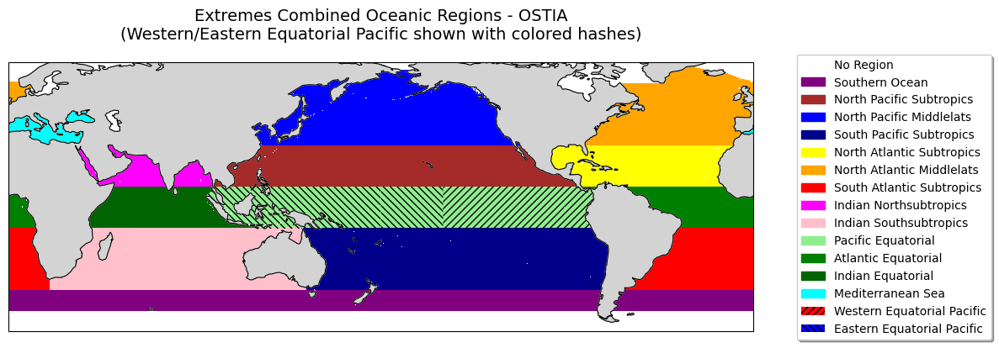

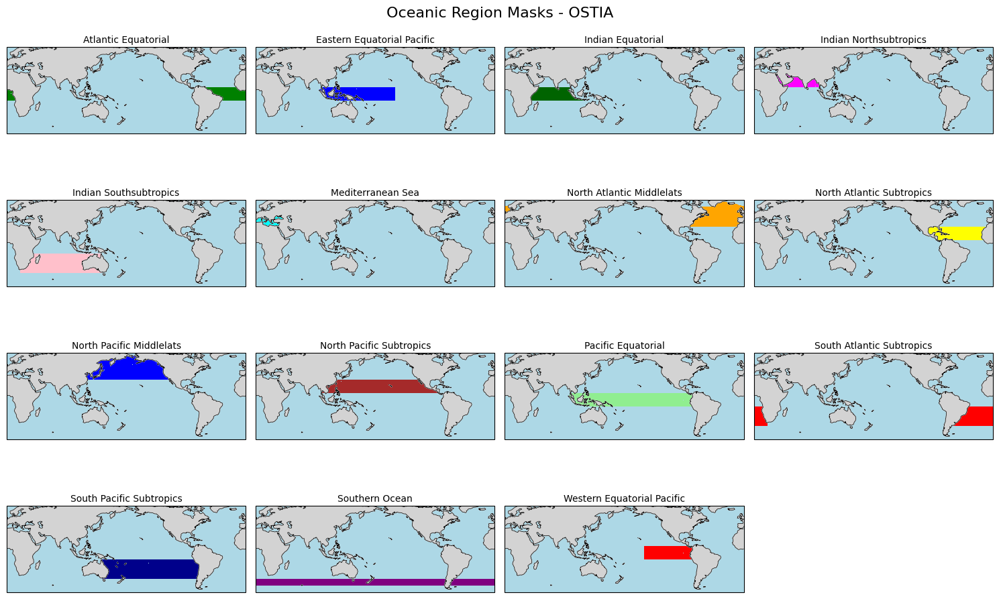

(<Figure size 1200x800 with 1 Axes>, <Figure size 1500x1000 with 16 Axes>)

In [13]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


# After creating your masks dictionary
masks_dict = create_model_specific_masks(models_dict)

# Quick visualization for a specific model
quick_visualize_masks(masks_dict, 'OSTIA')



In [ ]:
# Or do it step by step for more control:

# Plot combined regions map
fig_combined, ax_combined = plot_combined_regions_mask(masks_dict, 'OSTIA')
plt.show()

# Plot individual masks in subplots
fig_individual, axes_individual = plot_model_masks(masks_dict, 'OSTIA')
plt.show()

# Visualize for all models
for model_name in masks_dict.keys():
    print(f"\nVisualizing {model_name} masks:")
    quick_visualize_masks(masks_dict, model_name)

# EXTREMES

In [10]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


QUICK REGIONAL EXTREMES ANALYSIS WITH MODEL-SPECIFIC MASKS
COMPUTING REGIONAL EXTREMES WITH MODEL-SPECIFIC MASKS
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean', 'Western_Equatorial_Pacific']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTrop

/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(
2025-11-28 10:07:16,363 - distributed.worker - ERROR - Worker stream died during communication: tcp://127.0.0.1:38989
Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/comm/tcp.py", line 228, in read
    frames_nosplit = await read_bytes_rw(stream, frames_nosplit_nbytes)
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/comm/tcp.py", line 367, in read_bytes_rw
    actual = await stream.read_into(chunk)  # type: ignore[arg-type]
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/worker.py", line 2075, in gather_dep
    response = await get_data_from_worker(
  File "/home/b

  Atlantic_Equatorial: 18.0 days/year/gridcell (16979.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Eastern_Equatorial_Pacific: 18.5 days/year/gridcell (31270.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Indian_Equatorial: 18.3 days/year/gridcell (18520.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Indian_NorthSubTropics: 18.1 days/year/gridcell (8171.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Indian_SouthSubTropics: 18.2 days/year/gridcell (43648.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Mediterranean_Sea: 17.9 days/year/gridcell (4925.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  North_Atlantic_MiddleLats: 18.0 days/year/gridcell (34107.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  North_Atlantic_SubTropics: 18.3 days/year/gridcell (23656.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  North_Pacific_MiddleLats: 18.3 days/year/gridcell (48703.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  North_Pacific_SubTropics: 18.4 days/year/gridcell (46259.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Pacific_Equatorial: 18.1 days/year/gridcell (53993.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  South_Atlantic_SubTropics: 18.3 days/year/gridcell (29623.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  South_Pacific_SubTropics: 18.4 days/year/gridcell (65619.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Southern_Ocean: 18.1 days/year/gridcell (57139.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Western_Equatorial_Pacific: 18.3 days/year/gridcell (22723.0 grid cells)
Processing IFS-FESOM...


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Atlantic_Equatorial: 17.8 days/year/gridcell (16948.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Eastern_Equatorial_Pacific: 18.5 days/year/gridcell (31216.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Indian_Equatorial: 18.3 days/year/gridcell (18520.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Indian_NorthSubTropics: 17.9 days/year/gridcell (8152.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Indian_SouthSubTropics: 18.2 days/year/gridcell (43627.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Mediterranean_Sea: 17.9 days/year/gridcell (4842.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  North_Atlantic_MiddleLats: 18.3 days/year/gridcell (34070.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  North_Atlantic_SubTropics: 18.3 days/year/gridcell (23650.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  North_Pacific_MiddleLats: 18.6 days/year/gridcell (48580.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  North_Pacific_SubTropics: 18.3 days/year/gridcell (46235.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Pacific_Equatorial: 18.2 days/year/gridcell (53935.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  South_Atlantic_SubTropics: 18.4 days/year/gridcell (29635.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  South_Pacific_SubTropics: 18.4 days/year/gridcell (65613.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Southern_Ocean: 18.3 days/year/gridcell (57130.0 grid cells)


/home/b/b382616/.local/lib/python3.10/site-packages/dask/array/core.py:5097: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


  Western_Equatorial_Pacific: 18.6 days/year/gridcell (22719.0 grid cells)
PLOTTING REGIONAL EXTREMES BARCHART


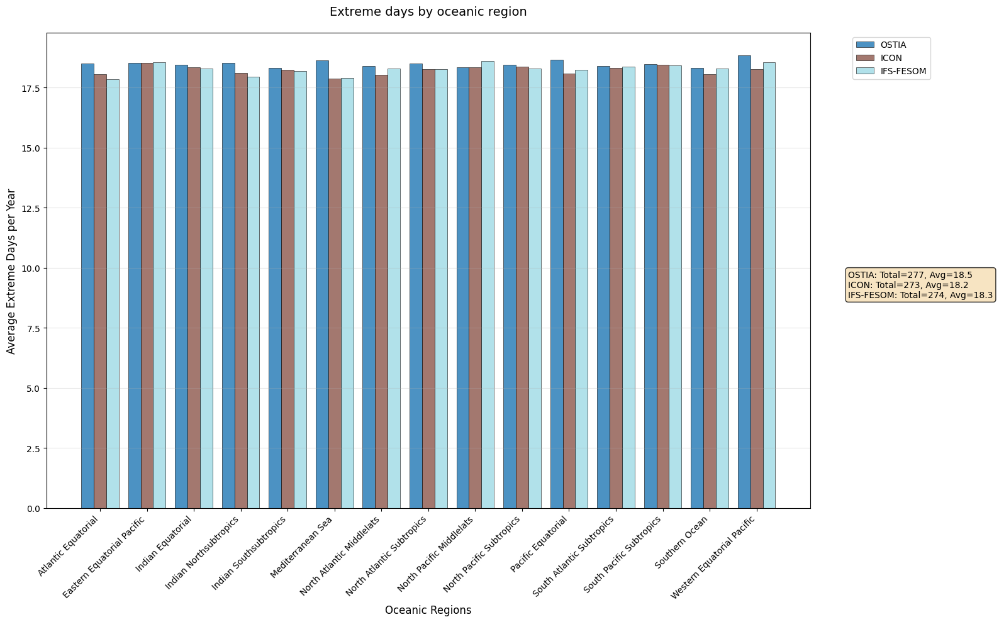

In [11]:
# Run the regional extremes analysis with different plot types

# Option A: Barchart (best for comparing models)
fig_barchart, ax_barchart, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='barchart',
    per_grid_cell=True,
    normalize=True, # Use Set1 colormap
    title="Extreme days by oceanic region"
)
plt.show()

In [ ]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex_s,      # Your OSTIA extreme events data
    'ICON': i_ex_s,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex_s   # Your IFS-FESOM extreme events data
}


# Run the regional extremes analysis with different plot types

# Option A: Barchart (best for comparing models)
print("=== REGIONAL EXTREMES ANALYSIS - BARCHART ===")
fig_barchart, ax_barchart, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='barchart',
    per_grid_cell=True,    # Normalize by grid cell count
    normalize=True,        # Normalize by years to get days/year
    title="SHIFTING BASELINE - Extreme days by oceanic region"
)
plt.show()

In [ ]:
# Option B: Heatmap (good for detailed comparisons)
print("\n=== REGIONAL EXTREMES ANALYSIS - HEATMAP ===")
fig_heatmap, ax_heatmap, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='heatmap',
    per_grid_cell=True,
    normalize=True,
    title="Extreme days heatmap"
)
plt.show()



In [ ]:
# Option C: Single model view
print("\n=== REGIONAL EXTREMES ANALYSIS - SINGLE MODEL ===")
fig_single, ax_single, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='single',
    per_grid_cell=True,
    normalize=True,
    title_template="{} - Regional Extreme Events"
)
plt.show()

# MHW EVENTS

In [9]:
o_ex=o_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
i_ex=i_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
f_ex=f_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})


In [10]:
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


In [11]:
# 1. Compute MHW events for all models
mhw_events_dict = compute_mhw_events_for_models(
    models_dict,
    min_duration=5,      # Minimum event duration in days
    max_gap=2,           # Maximum gap between events to merge
    max_events_per_cell=1000
)



COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...
  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...
  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...
  Total events: 15846317
  Average duration: 14.0 days


QUICK MHW EVENTS ANALYSIS
COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...
  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...
  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...
  Total events: 15846317
  Average duration: 14.0 days
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean', 'Western_Equatorial_Pacific']
Creating masks for ICON...
Loading existing masks for model grid

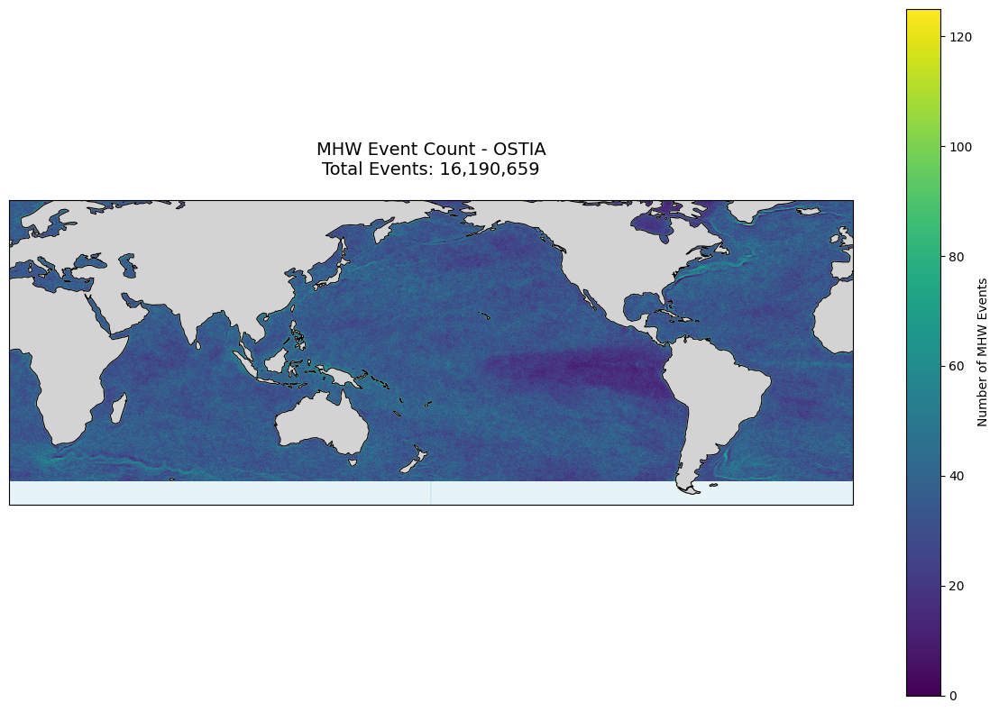

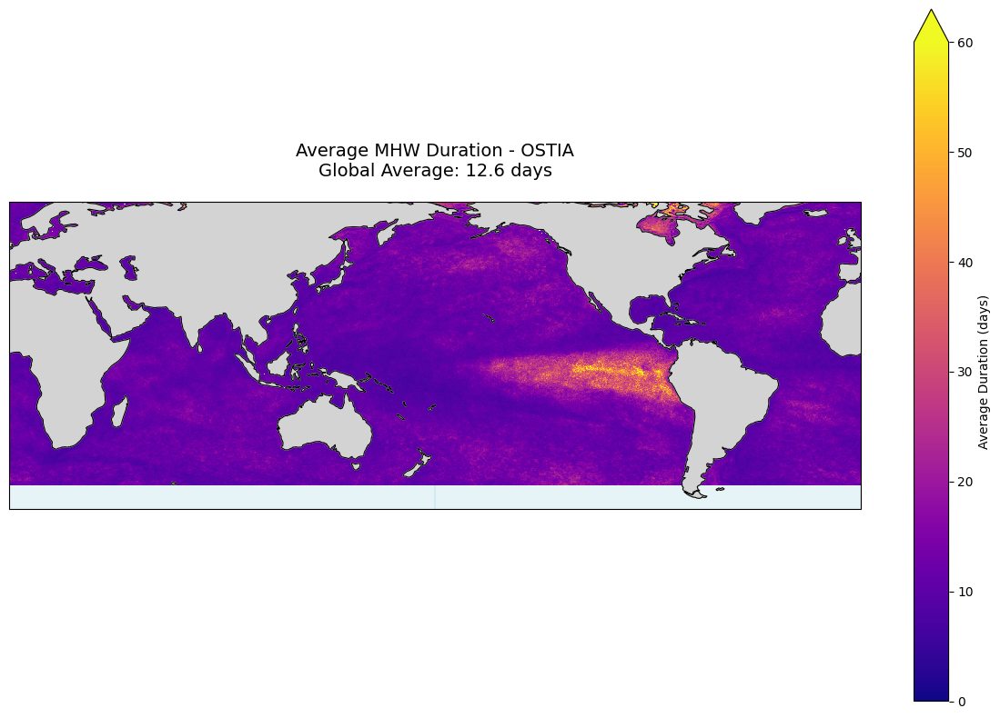

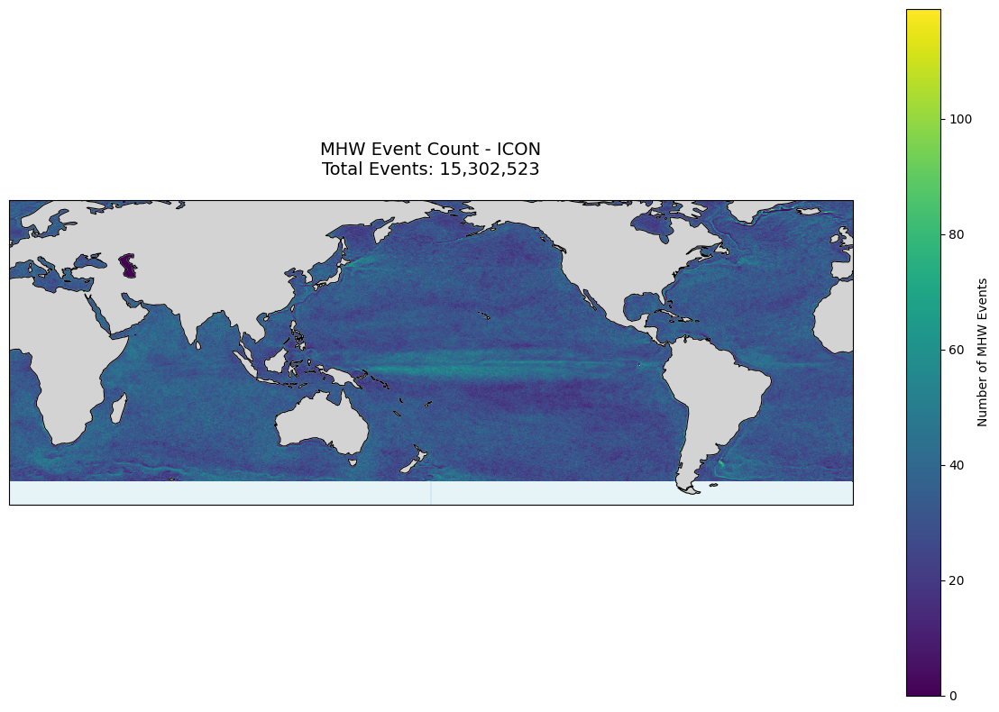

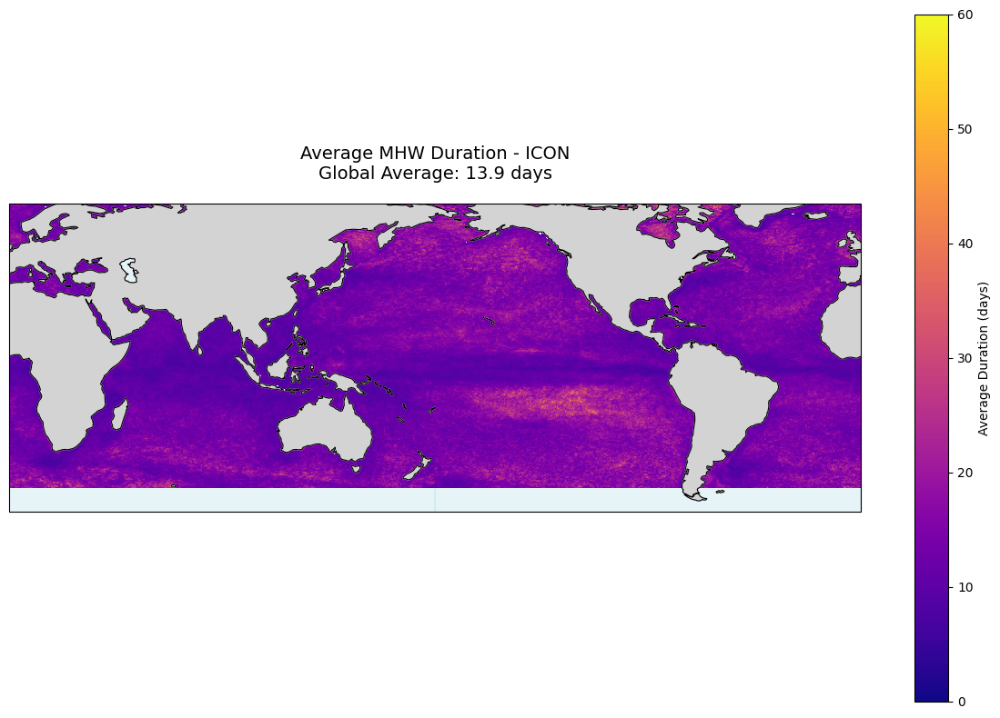

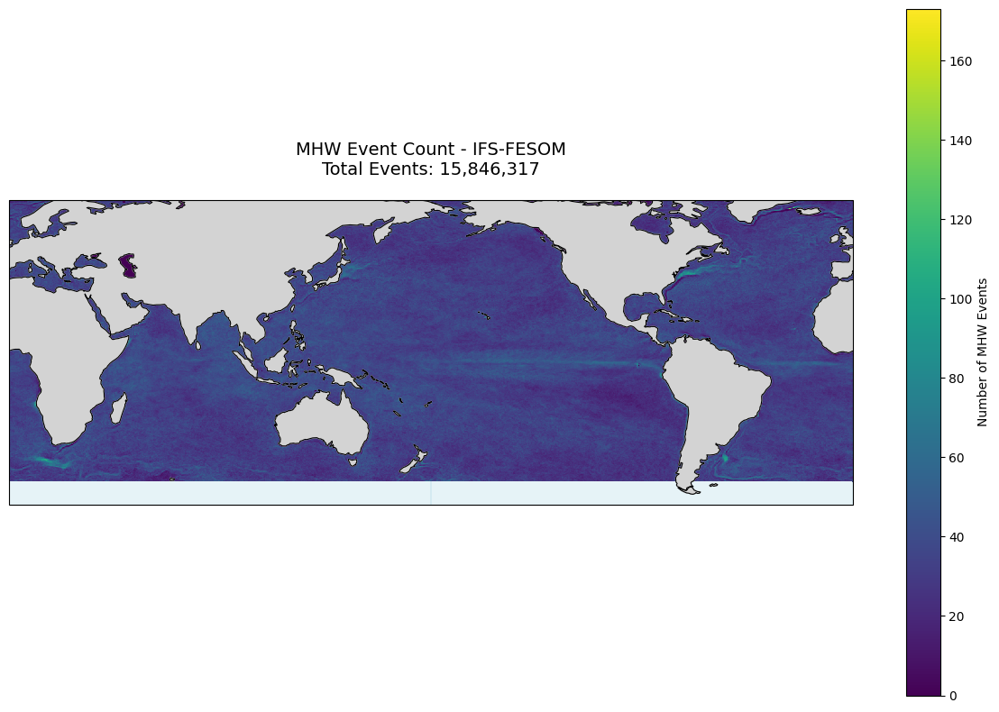

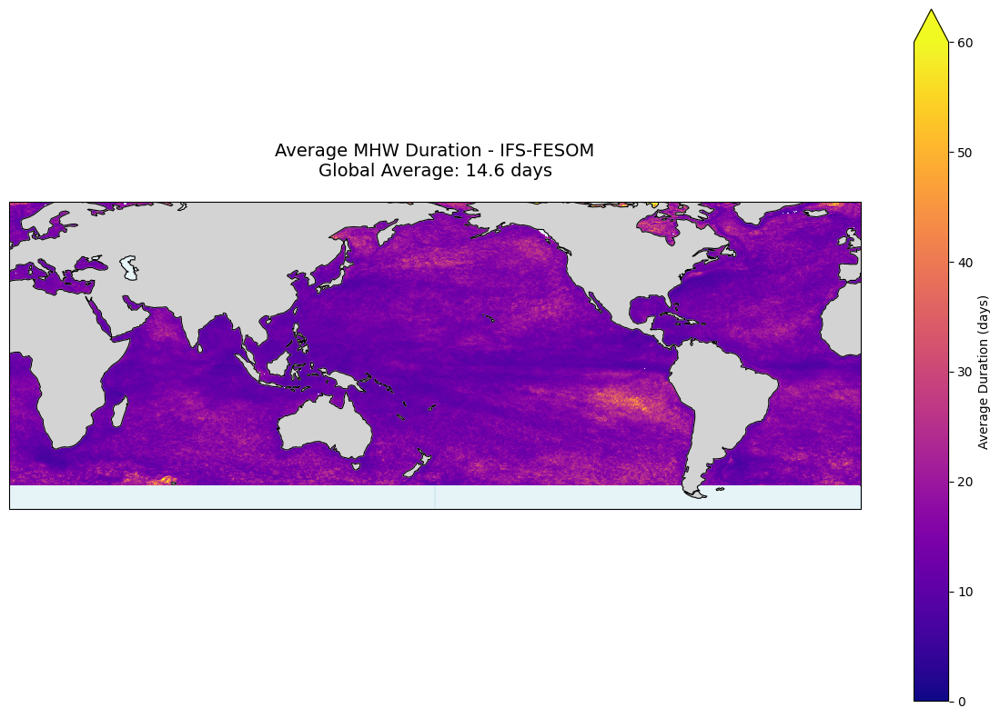


CREATING REGIONAL COMPARISONS...
PLOTTING REGIONAL MHW EVENT_COUNT BARCHART


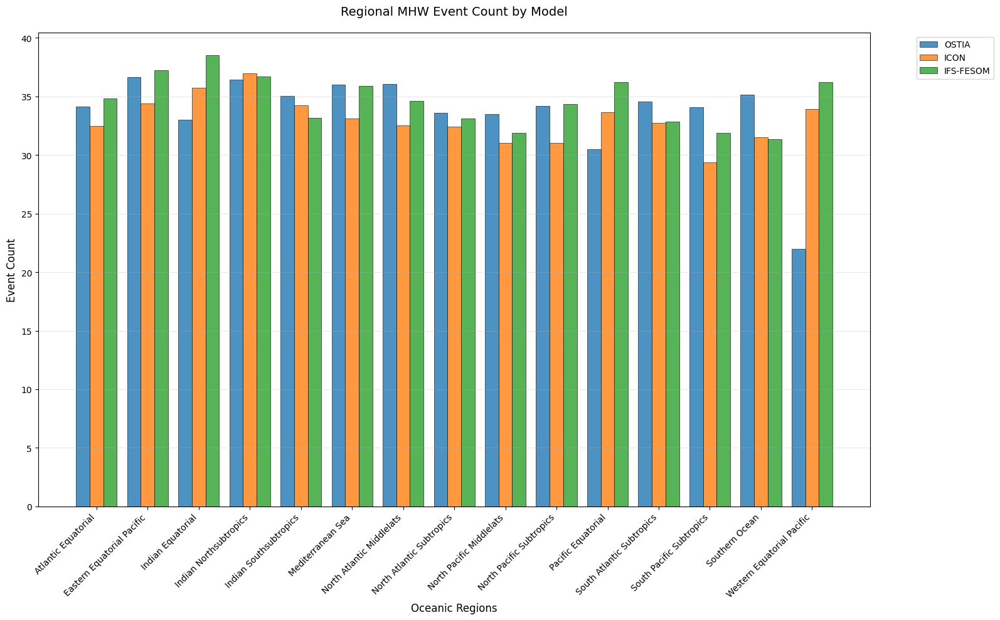

PLOTTING REGIONAL MHW TOTAL_EVENT_DAYS BARCHART


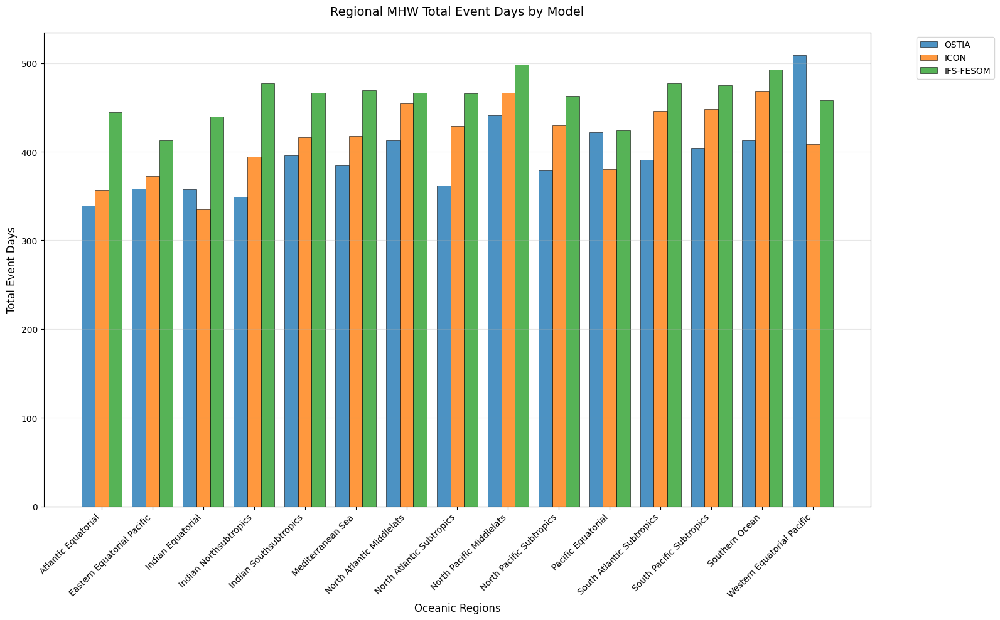

PLOTTING REGIONAL MHW AVG_DURATION BARCHART


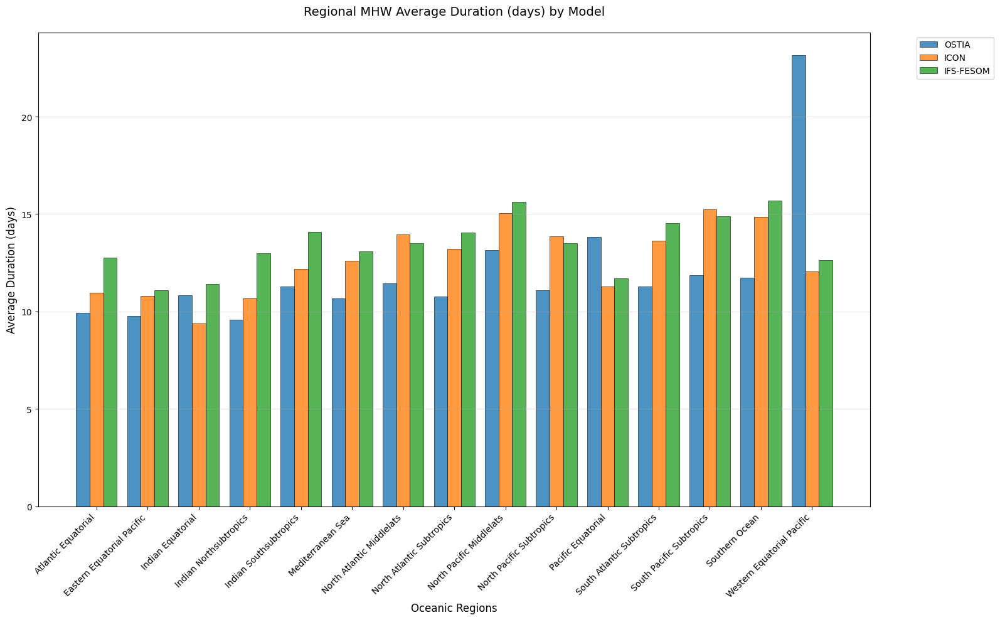

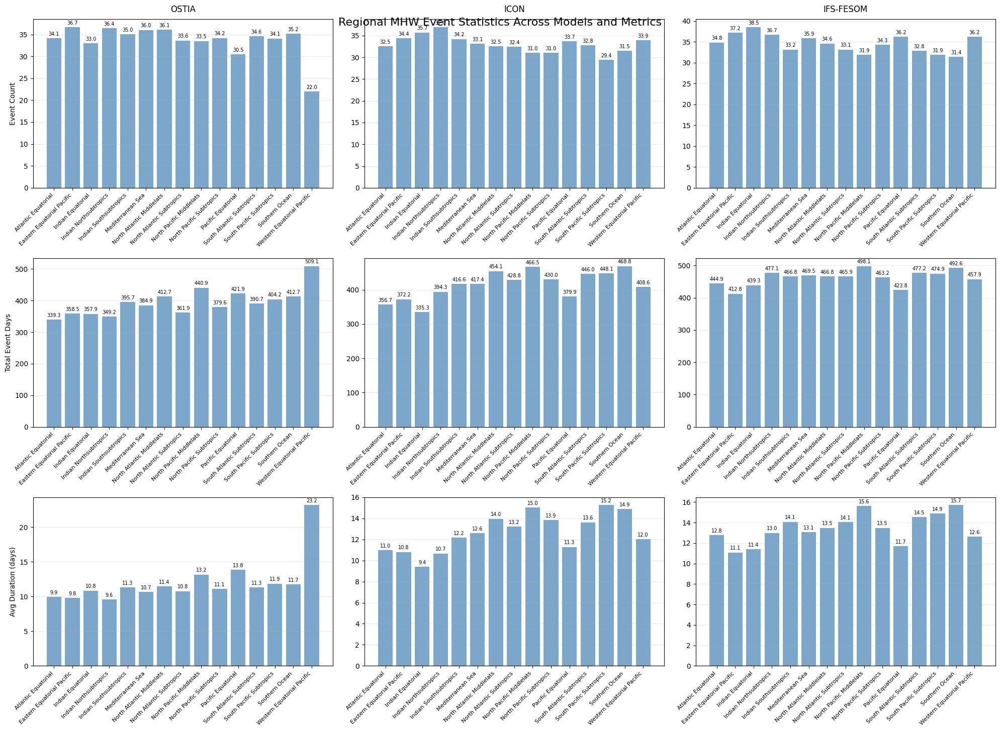

In [15]:
# Use the quick analysis function with custom colorbar limits
mhw_events_dict, regional_mhw_data, masks_dict = quick_mhw_events_analysis(
    models_dict,
    min_duration=5,
    max_gap=2,
    plot_maps=True,           # This will show maps automatically
    plot_regional=True,    # Maximum value for event count colorbar  
    vmin_avg_duration=0,      # Minimum value for average duration colorbar
    vmax_avg_duration=60      # Maximum value for average duration colorbar
)

## to pick wich graphs

In [14]:
o_ex=o_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
i_ex=i_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
f_ex=f_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})

models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


SELECTIVE MHW ANALYSIS - SHOWING ONLY SPECIFIED PLOTS
Plots to show: ['regional_summary']
QUICK MHW EVENTS ANALYSIS
COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...
  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...
  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...
  Total events: 15846317
  Average duration: 14.0 days
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean']
Creating masks for ICON...
Loading

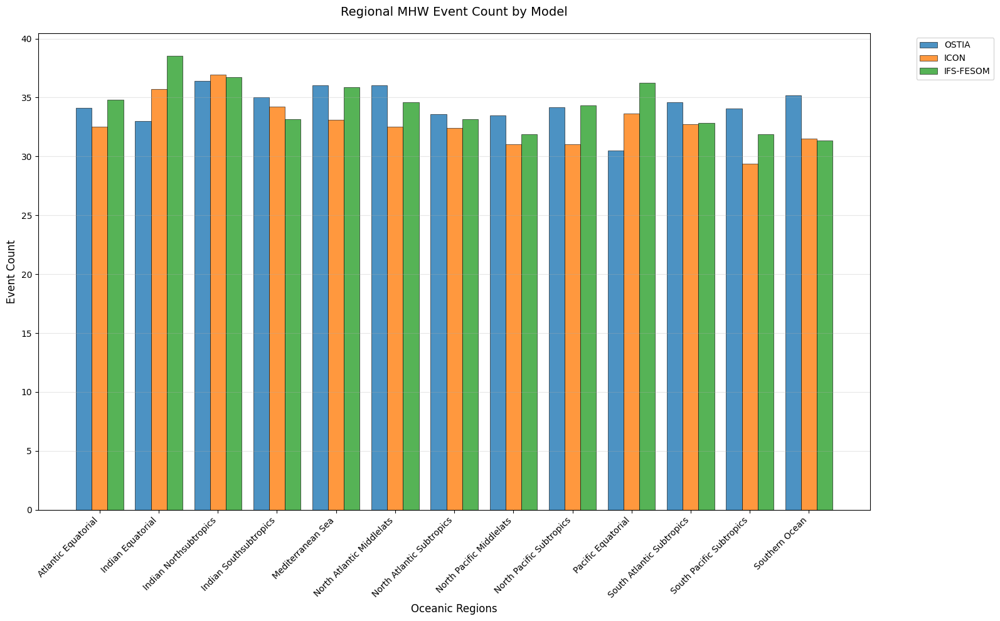

In [15]:
# Show ONLY the average number of events per region per model
mhw_events_dict, regional_mhw_data, masks_dict = selective_mhw_analysis(
    models_dict,
    plots_to_show=['regional_summary'],  # This will show just the event count barchart
    min_duration=5,
    max_gap=2
)

SELECTIVE MHW ANALYSIS - SHOWING ONLY SPECIFIED PLOTS
Plots to show: ['events_map']
QUICK MHW EVENTS ANALYSIS
COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...
  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...
  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...
  Total events: 15846317
  Average duration: 14.0 days
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean']
Creating masks for ICON...
Loading exist

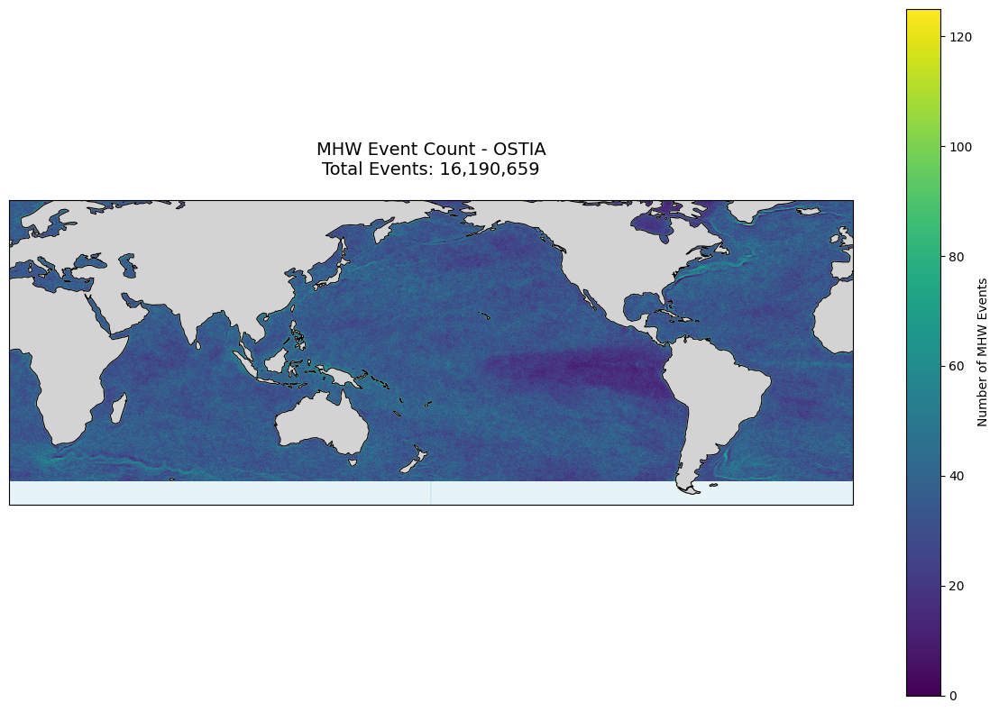

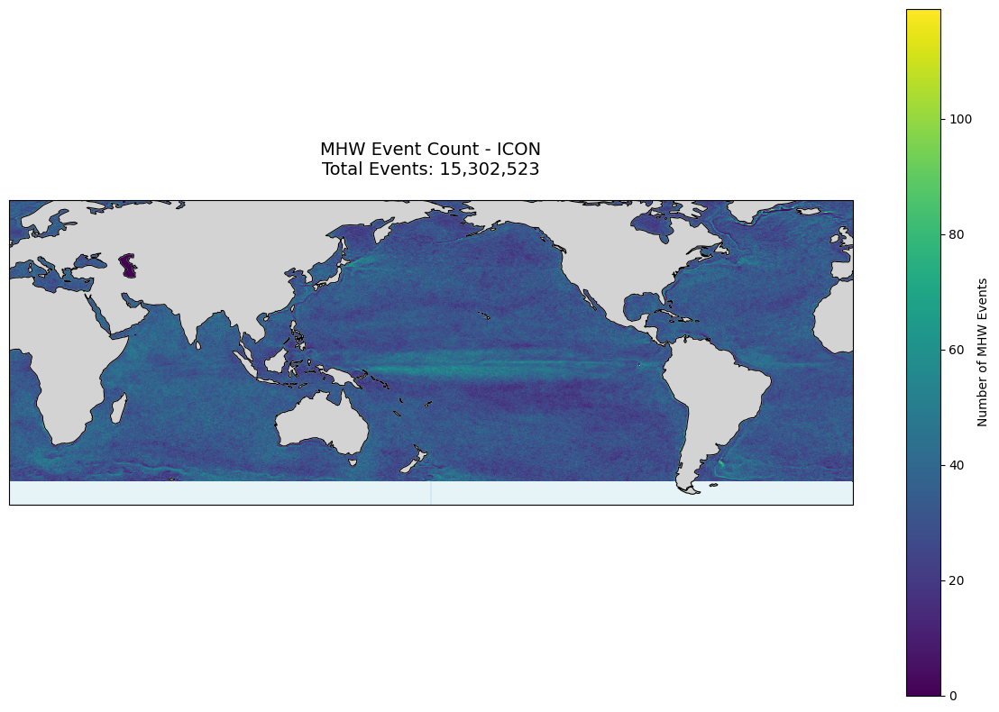

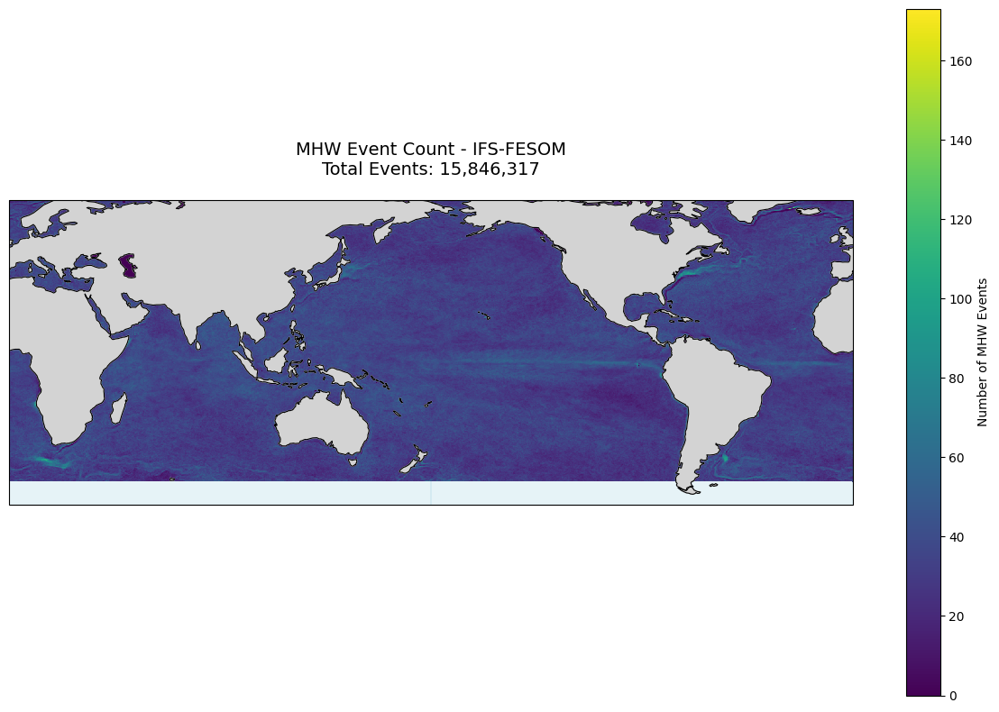

In [12]:
# Show only events map and regional summary
mhw_events_dict, regional_mhw_data, masks_dict = selective_mhw_analysis(
    models_dict,
    plots_to_show=['events_map'],
    min_duration=5,
    max_gap=2
)

In [ ]:
# Show only the comprehensive grid plot
mhw_events_dict, regional_mhw_data, masks_dict = selective_mhw_analysis(
    models_dict,
    plots_to_show=['regional_grid'],
    min_duration=5,
    max_gap=2
)

In [ ]:
# Show only the comprehensive grid plot
mhw_events_dict, regional_mhw_data, masks_dict = selective_mhw_analysis(
    models_dict,
    plots_to_show=['avg_duration'],
    min_duration=5,
    max_gap=2
)

In [9]:
# Print the function's docstring to see the available options
print(selective_mhw_analysis.__doc__)


    Wrapper for selective MHW analysis plotting
    
    Parameters:
    -----------
    models_dict : dict
        Dictionary with model names as keys and extreme events DataArrays as values
    plots_to_show : list
        List of plot types to show. Options:
        - 'events_map': MHW event count maps
        - 'duration_map': MHW average duration maps  
        - 'regional_events': Regional event count barchart
        - 'regional_duration': Regional duration barchart
        - 'regional_event_days': Regional total event days barchart
        - 'regional_grid': Regional comparison grid
        - 'regional_summary': Regional summary (the one you want)
    **kwargs : additional arguments passed to quick_mhw_events_analysis
    
    Returns:
    --------
    mhw_events_dict : dict
        Dictionary with MHW event datasets
    regional_mhw_data : dict
        Dictionary with regional MHW statistics
    masks_dict : dict
        Dictionary with model-specific masks
    


# MHW Intensity Plotting Functions



## Single Model Map Plots

### `plot_avg_intensity_map`
- **What it plots**: Average of event average intensities per grid cell
- **Default title**: "MHW average intensity of all average intensities"
- **Parameters**: 
  - `intensity_ds`: Intensity dataset
  - `model_name`: Model identifier
  - `figsize`: Figure dimensions
  - `central_longitude`: Map projection center
  - `vmin`, `vmax`: Color scale limits
  - `title`: Custom title (optional)

### `plot_avg_of_max_intensity_map`
- **What it plots**: Average of event maximum intensities per grid cell
- **Default title**: "MHW average intensity of all maximum intensities"
- **Parameters**: Same as above

### `plot_max_intensity_map`
- **What it plots**: Maximum of event maximum intensities per grid cell
- **Default title**: "MHW max intensity of all max intensities"
- **Parameters**: Same as above

## Multi-Model Comparison Plots

### `plot_multi_model_intensity_maps`
- **What it plots**: Grid of maps for multiple models
- **Parameters**:
  - `intensity_dict`: Dictionary of {model_name: intensity_ds}
  - `plot_type`: One of: `'avg_intensity'` (average of averages), `'avg_of_max_intensity'` (average of maxima), `'max_intensity'` (maxima of maxima)
  - `figsize`, `central_longitude`, `vmin`, `vmax`: Same as single plots
  - `titles`: Dictionary of custom titles per model

## Duration vs Intensity Relationship Plots

### `plot_duration_intensity_scatter`
- **What it plots**: 3 scatter plots (duration vs avg/max/median intensity)
- **Parameters**:
  - `mhw_events_ds`: MHW events dataset (contains durations)
  - `intensity_ds`: Intensity dataset
  - `model_name`: Model identifier
  - `max_points`: Maximum points to plot (for performance)
  - `figsize`: Figure dimensions

### `plot_duration_intensity_hist2d`
- **What it plots**: 3 density plots (2D histograms) of duration vs intensity
- **Parameters**: Same as scatter plots

## Convenience Functions

### `create_all_intensity_plots`
- **What it plots**: All plots for single or multiple models
- **Parameters**:
  - `mhw_events_dict`: Dictionary of {model_name: mhw_events_ds}
  - `intensity_dict`: Dictionary of {model_name: intensity_ds}
  - `model_names`: List of models to plot (optional)

In [13]:
o_ex=o_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
i_ex=i_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
f_ex=f_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})


models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


In [14]:
# Your existing setup
o_mhws = create_mhw_event_dataset(o_ex, min_duration=5, max_gap=2, max_events_per_cell=100)
i_mhws = create_mhw_event_dataset(i_ex, min_duration=5, max_gap=2, max_events_per_cell=100)  
f_mhws = create_mhw_event_dataset(f_ex, min_duration=5, max_gap=2, max_events_per_cell=100)

Creating MHW event dataset...
Creating MHW event dataset...
Creating MHW event dataset...


In [15]:
ossta=ossta.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
issta=issta.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
fssta=fssta.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})


models_ssta= {
    'OSTIA': ossta,     
    'ICON': issta,      
    'IFS-FESOM': fssta  
}

In [16]:

o_mag = compute_event_magnitude_vectorized(o_mhws, ossta)

i_mag = compute_event_magnitude_vectorized(i_mhws, issta)

f_mag = compute_event_magnitude_vectorized(f_mhws, fssta)



Computing MHW magnitude statistics (vectorized Dask approach)...
Processing grid: 480 x 1440 x 100 events
Applying vectorized computation...
Computing MHW magnitude statistics (vectorized Dask approach)...
Processing grid: 481 x 1440 x 100 events
Applying vectorized computation...
Computing MHW magnitude statistics (vectorized Dask approach)...
Processing grid: 481 x 1440 x 100 events
Applying vectorized computation...


In [17]:
# Multiple models
magnitude_dict = {
    'OSTIA': o_mag,
    'ICON': i_mag, 
    'IFS-FESOM': f_mag
}

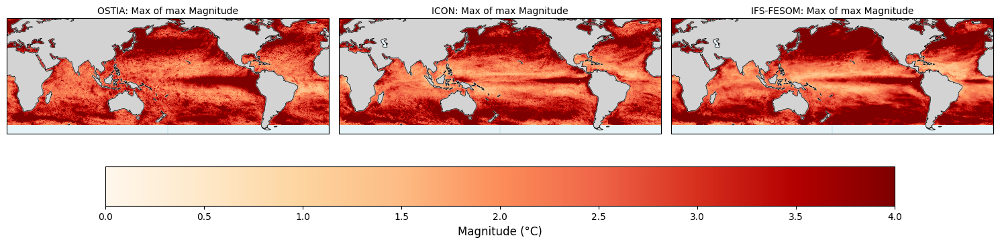

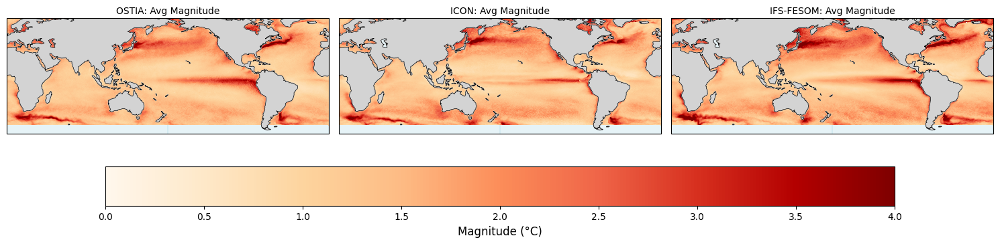

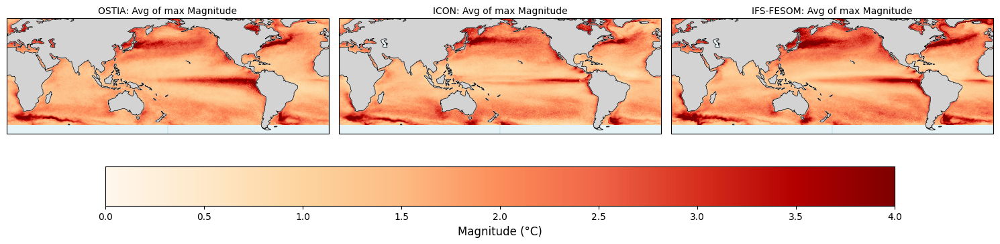

In [18]:


# Multiple models (now using magnitude_dict instead of intensity_dict)
magnitude_dict = {
    'OSTIA': o_mag,
    'ICON': i_mag, 
    'IFS-FESOM': f_mag
}
# Plot maximum magnitude for all models with consistent color scale
fig, axes = plot_multi_model_magnitude_maps(
    magnitude_dict, 
    plot_type='max_magnitude',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Max of max Magnitude',
        'ICON': 'ICON: Max of max Magnitude', 
        'IFS-FESOM': 'IFS-FESOM: Max of max Magnitude'
    }
)


# Plot average magnitude for all models with consistent color scale
fig, axes = plot_multi_model_magnitude_maps(
    magnitude_dict, 
    plot_type='avg_magnitude',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Avg Magnitude',
        'ICON': 'ICON: Avg Magnitude', 
        'IFS-FESOM': 'IFS-FESOM: Avg Magnitude'
    }
)

# Plot average of maximum magnitudes for all models with consistent color scale
fig, axes = plot_multi_model_magnitude_maps(
    magnitude_dict, 
    plot_type='avg_of_max_magnitude',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Avg of max Magnitude',
        'ICON': 'ICON: Avg of max Magnitude', 
        'IFS-FESOM': 'IFS-FESOM: Avg of max Magnitude'
    }
)

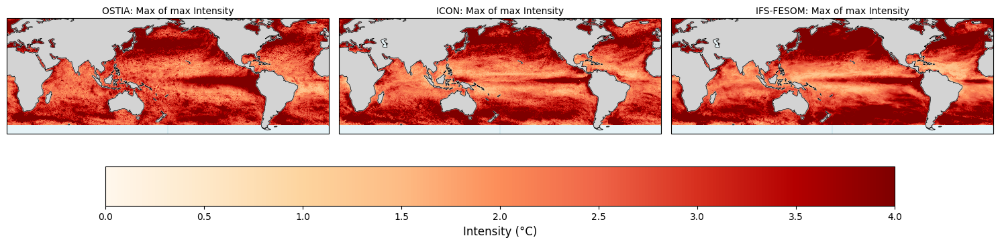

In [19]:

# Plot average intensity for all models with consistent color scale
fig, axes = plot_multi_model_intensity_maps(
    intensity_dict, 
    plot_type='max_intensity',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Max of max Intensity',
        'ICON': 'ICON: Max of max Intensity', 
        'IFS-FESOM': 'IFS-FESOM: Max of max Intensity'
    }
)

2025-11-24 17:07:53,336 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 4.43 GiB -- Worker memory limit: 7.36 GiB
2025-11-24 17:07:54,443 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 5.53 GiB -- Worker memory limit: 7.36 GiB
2025-11-24 17:07:56,395 - distributed.worker - ERROR - Worker stream died during communication: tcp://127.0.0.1:32889
Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/comm/tcp.py", line 226, in read
    frames_nosplit_nbytes_bin = await

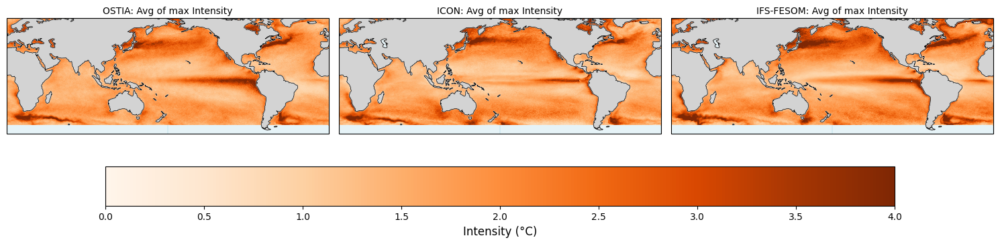

In [18]:

# Plot average intensity for all models with consistent color scale
fig, axes = plot_multi_model_intensity_maps(
    intensity_dict, 
    plot_type='avg_of_max_intensity',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Avg of max Intensity',
        'ICON': 'ICON: Avg of max Intensity', 
        'IFS-FESOM': 'IFS-FESOM: Avg of max Intensity'
    }
)

# Time series
## here we have two main functions, one is:
plot_sst_with_event_markers
## which gives you the classic hobday time-series plot with SST, climatology and threshold. Red fille area corresponds to extremes. Actual MHW events are marked by dashed lines.

## The other function is:
plot_sst_trim_mhw_events
## which gives you a similar plot, but only plots times when there were MHW events, the trimmes segments are shown back to back

### you need to first run compute_mhw_events_for_models

In [12]:
o_ex=o_ex.chunk(chunks={'time': 100, 'lat': 50, 'lon': 50})
i_ex=i_ex.chunk(chunks={'time': 100, 'lat': 50, 'lon': 50})
f_ex=f_ex.chunk(chunks={'time': 100, 'lat': 50, 'lon': 50})


In [13]:
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}

masks_dict = create_model_specific_masks(models_dict)

Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean', 'Western_Equatorial_Pacific']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Eastern_Equatorial_Pacific', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 

In [14]:
model_data_mapping = {
    'OSTIA': {
        'sst': sst,
        'ssta': ossta,
        'thresholds': ds.thresholds,
        'mhw_events': mhw_events_dict['OSTIA']
    },
    'ICON': {
        'sst': sst_ic,
        'ssta': issta,
        'thresholds': i_ds.thresholds,
        'mhw_events': mhw_events_dict['ICON']
    },
    'IFS-FESOM': {
        'sst': sst_f,
        'ssta': fssta,
        'thresholds': f_ds.thresholds,
        'mhw_events': mhw_events_dict['IFS-FESOM']
    }
}


Trimmed to 450 days around 36 MHW events

Displaying 450 days around 36 MHW events:
------------------------------------------------------------
Segment 1: 1982-01-14 to 1982-01-25 (12 days)
Segment 2: 1982-08-16 to 1982-08-27 (12 days)
Segment 3: 1986-10-12 to 1986-10-20 (9 days)
Segment 4: 1989-11-17 to 1989-11-27 (11 days)
Segment 5: 1990-02-12 to 1990-03-04 (21 days)
Segment 6: 1990-03-13 to 1990-03-21 (9 days)
Segment 7: 1990-05-22 to 1990-06-25 (35 days)
Segment 8: 1990-07-08 to 1990-07-16 (9 days)
Segment 9: 1991-04-27 to 1991-05-04 (8 days)
Segment 10: 1996-01-25 to 1996-02-02 (9 days)
Segment 11: 1996-05-03 to 1996-05-13 (11 days)
Segment 12: 1998-09-19 to 1998-09-27 (9 days)
Segment 13: 1998-12-13 to 1998-12-20 (8 days)
Segment 14: 2002-05-16 to 2002-05-23 (8 days)
Segment 15: 2002-07-06 to 2002-07-15 (10 days)
Segment 16: 2002-07-18 to 2002-07-27 (10 days)
Segment 17: 2002-09-29 to 2002-10-09 (11 days)
Segment 18: 2002-11-01 to 2002-11-30 (30 days)
Segment 19: 2006-03-30 to 

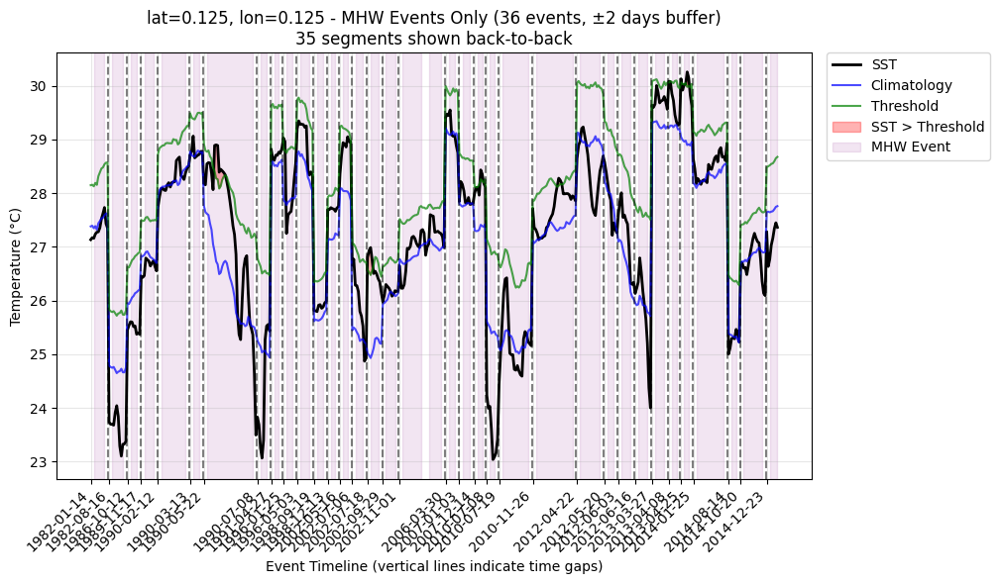

In [15]:
# PLOT TRIMMED TIME SERIES BASIC USAGE
fig2, events2 = plot_sst_trim_mhw_events(
    sst, ossta, ds.thresholds,
    mhw_events_dict['IFS-FESOM'],
    lat=0, lon=0,
    trim_to_events=True,
    buffer_days=2
)


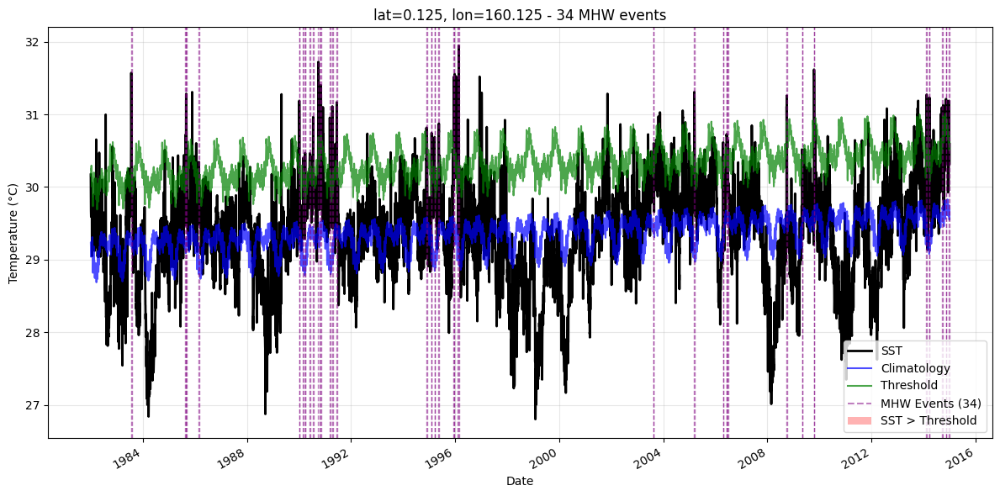

In [15]:
# PLOT TIME SERIES BASIC USAGE
fig = plot_sst_with_event_markers(
    sst,                    # OSTIA SST data
    ossta,                  # OSTIA SSTA data
    ds.thresholds,          # OSTIA thresholds
    mhw_events_dict['OSTIA'],  # OSTIA MHW events
    lat=0,                  # Latitude
    lon=160                 # Longitude
)
plt.show()

In [ ]:
# ============================================
# let's look at TRIMMED TIME SERIES FOR MULTIPLE POINTS
# ============================================

In [16]:
# ============================================
# DEFINE POINTS OF INTEREST
# ============================================
points_of_interest = [
    # Western Equatorial Pacific points
    {"name": "Western_EQ_Pacific_1", "lat": 0, "lon": 160},
    {"name": "Western_EQ_Pacific_2", "lat": 5, "lon": 170},
    {"name": "Western_EQ_Pacific_3", "lat": -5, "lon": 150},
    
    # Eastern Equatorial Pacific points  
    {"name": "Eastern_EQ_Pacific_1", "lat": 0, "lon": -110},
    {"name": "Eastern_EQ_Pacific_2", "lat": 5, "lon": -120},
    {"name": "Eastern_EQ_Pacific_3", "lat": -5, "lon": -100},
]


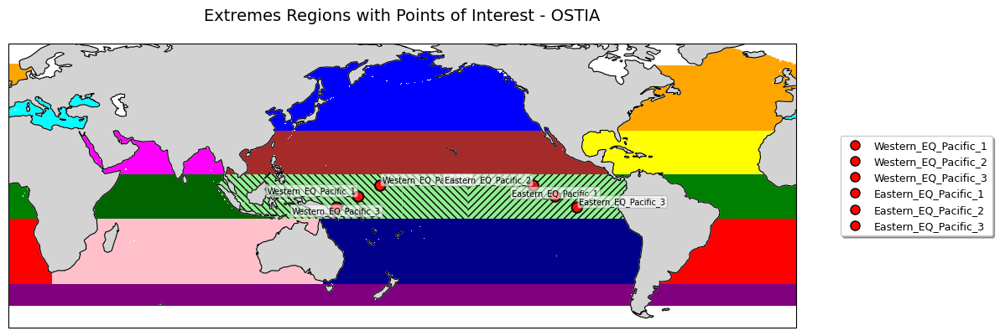

In [20]:
# ============================================
# VISUALISE POINTS OF INTEREST
# ============================================


fig, ax = plot_points_on_masks(
    masks_dict,
    model_name='OSTIA',
    points_of_interest=points_of_interest,
    point_size=80,
    label_fontsize=7,  # Smaller font
    label_alpha=0.6,   # More transparent
    label_offset=(1, 0.5)  # Smaller offset
)
plt.show()


Trimmed to 430 days around 34 MHW events

Displaying 430 days around 34 MHW events:
------------------------------------------------------------
Segment 1: 1983-07-18 to 1983-08-02 (16 days)
Segment 2: 1985-08-19 to 1985-09-09 (22 days)
Segment 3: 1986-02-22 to 1986-03-02 (9 days)
Segment 4: 1990-01-01 to 1990-01-09 (9 days)
Segment 5: 1990-02-26 to 1990-03-06 (9 days)
Segment 6: 1990-03-26 to 1990-04-04 (10 days)
Segment 7: 1990-05-27 to 1990-06-15 (20 days)
Segment 8: 1990-07-14 to 1990-07-23 (10 days)
Segment 9: 1990-09-26 to 1990-10-14 (19 days)
Segment 10: 1990-10-31 to 1990-11-12 (13 days)
Segment 11: 1991-03-05 to 1991-03-19 (15 days)
Segment 12: 1991-04-05 to 1991-04-20 (16 days)
Segment 13: 1991-06-11 to 1991-06-19 (9 days)
Segment 14: 1994-11-23 to 1994-12-04 (12 days)
Segment 15: 1995-02-01 to 1995-02-10 (10 days)
Segment 16: 1995-03-17 to 1995-03-25 (9 days)
Segment 17: 1995-05-12 to 1995-05-21 (10 days)
Segment 18: 1995-12-09 to 1995-12-18 (10 days)
Segment 19: 1995-12-22 

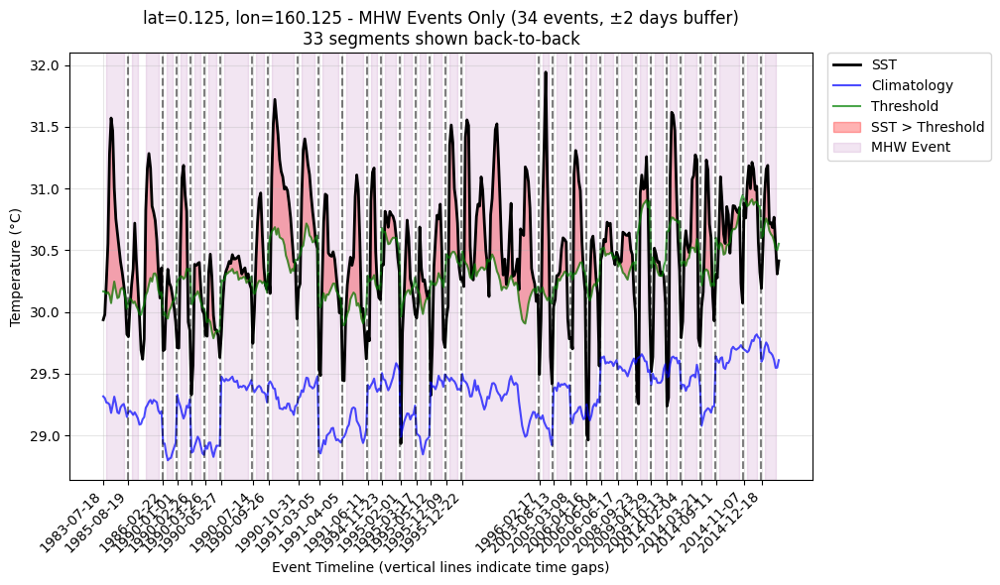

Trimmed to 413 days around 33 MHW events

Displaying 413 days around 33 MHW events:
------------------------------------------------------------
Segment 1: 1982-01-09 to 1982-01-18 (10 days)
Segment 2: 1982-10-29 to 1982-11-17 (20 days)
Segment 3: 1983-05-05 to 1983-05-15 (11 days)
Segment 4: 1983-05-29 to 1983-07-06 (39 days)
Segment 5: 1983-07-22 to 1983-08-12 (22 days)
Segment 6: 1983-09-17 to 1983-09-27 (11 days)
Segment 7: 1985-07-26 to 1985-08-05 (11 days)
Segment 8: 1990-02-21 to 1990-03-07 (15 days)
Segment 9: 1990-03-20 to 1990-03-30 (11 days)
Segment 10: 1990-05-08 to 1990-05-16 (9 days)
Segment 11: 1990-11-29 to 1990-12-21 (23 days)
Segment 12: 1991-03-11 to 1991-03-19 (9 days)
Segment 13: 1991-04-22 to 1991-05-05 (14 days)
Segment 14: 1991-06-23 to 1991-07-04 (12 days)
Segment 15: 1994-11-17 to 1994-12-01 (15 days)
Segment 16: 1995-02-16 to 1995-02-26 (11 days)
Segment 17: 1996-01-13 to 1996-01-21 (9 days)
Segment 18: 1997-02-12 to 1997-02-21 (10 days)
Segment 19: 1997-03-0

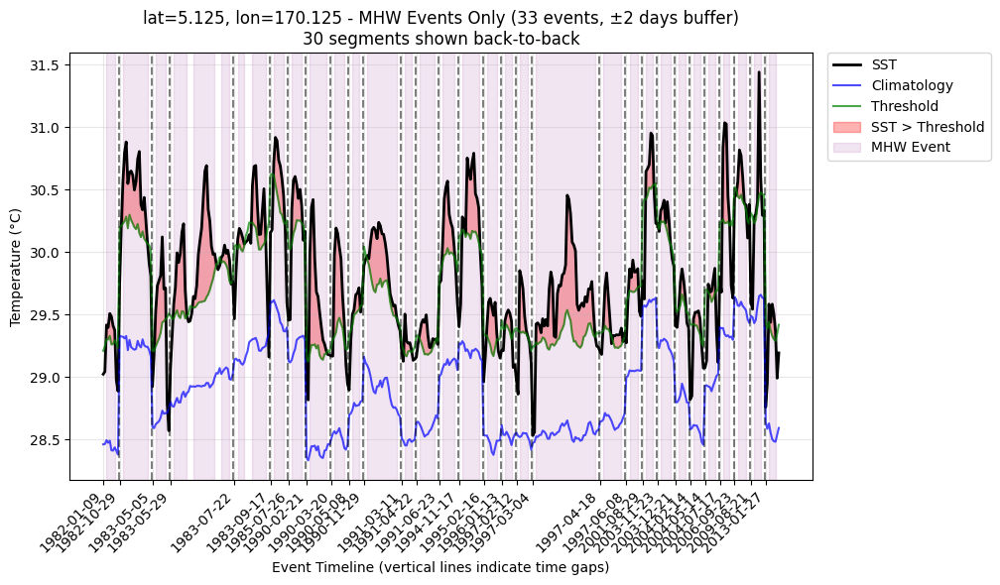

Trimmed to 589 days around 45 MHW events

Displaying 589 days around 45 MHW events:
------------------------------------------------------------
Segment 1: 1985-04-23 to 1985-05-05 (13 days)
Segment 2: 1985-05-22 to 1985-06-22 (32 days)
Segment 3: 1985-07-16 to 1985-07-26 (11 days)
Segment 4: 1985-08-23 to 1985-09-08 (17 days)
Segment 5: 1988-03-24 to 1988-04-02 (10 days)
Segment 6: 1988-07-06 to 1988-07-14 (9 days)
Segment 7: 1989-05-13 to 1989-05-25 (13 days)
Segment 8: 1989-07-28 to 1989-08-26 (30 days)
Segment 9: 1989-09-25 to 1989-10-12 (18 days)
Segment 10: 1990-02-13 to 1990-02-28 (16 days)
Segment 11: 1995-05-10 to 1995-05-22 (13 days)
Segment 12: 1995-07-14 to 1995-07-23 (10 days)
Segment 13: 1995-10-20 to 1995-10-28 (9 days)
Segment 14: 1995-11-03 to 1995-11-21 (19 days)
Segment 15: 1995-11-23 to 1995-12-11 (19 days)
Segment 16: 1995-12-27 to 1996-01-14 (19 days)
Segment 17: 1996-02-03 to 1996-02-19 (17 days)
Segment 18: 1996-04-07 to 1996-04-22 (16 days)
Segment 19: 1996-07-

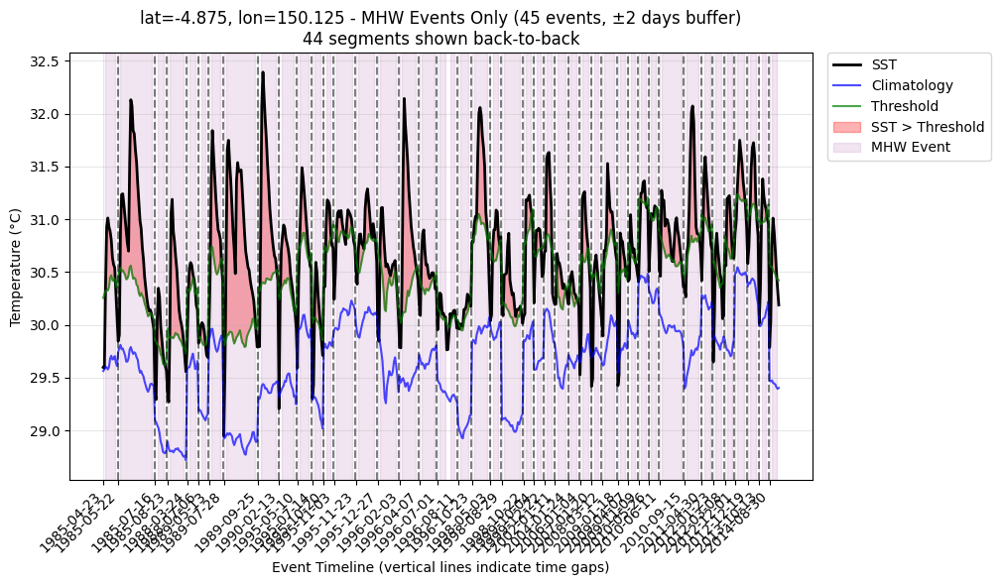

Trimmed to 692 days around 20 MHW events

Displaying 692 days around 20 MHW events:
------------------------------------------------------------
Segment 1: 1982-10-02 to 1982-10-15 (14 days)
Segment 2: 1982-10-18 to 1983-03-05 (139 days)
Segment 3: 1983-04-03 to 1983-06-20 (79 days)
Segment 4: 1983-06-22 to 1983-06-30 (9 days)
Segment 5: 1987-07-05 to 1987-07-13 (9 days)
Segment 6: 1987-09-01 to 1987-09-12 (12 days)
Segment 7: 1992-05-06 to 1992-05-14 (9 days)
Segment 8: 1994-10-14 to 1994-10-22 (9 days)
Segment 9: 1997-06-04 to 1997-06-13 (10 days)
Segment 10: 1997-06-20 to 1998-04-23 (308 days)
Segment 11: 1998-04-25 to 1998-05-14 (20 days)
Segment 12: 2006-11-30 to 2006-12-11 (12 days)
Segment 13: 2009-08-20 to 2009-08-29 (10 days)
Segment 14: 2009-12-17 to 2009-12-28 (12 days)
Segment 15: 2012-07-24 to 2012-08-04 (12 days)
Segment 16: 2014-06-13 to 2014-06-22 (10 days)
Segment 17: 2014-08-28 to 2014-09-05 (9 days)
Segment 18: 2014-12-10 to 2014-12-18 (9 days)

MHW Events in plot:
✓

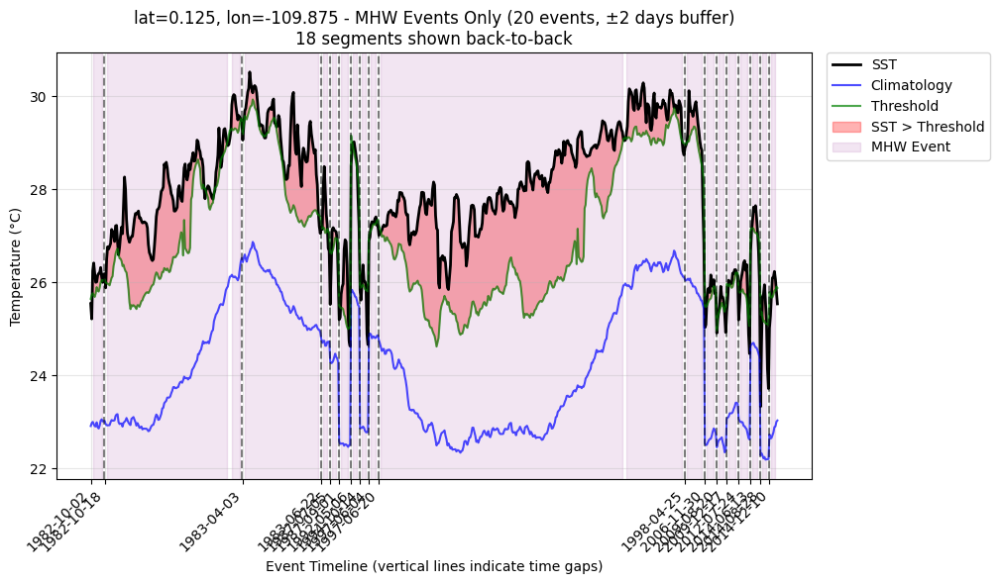

Trimmed to 553 days around 21 MHW events

Displaying 553 days around 21 MHW events:
------------------------------------------------------------
Segment 1: 1982-10-16 to 1982-10-25 (10 days)
Segment 2: 1982-10-30 to 1982-12-22 (54 days)
Segment 3: 1982-12-26 to 1983-01-17 (23 days)
Segment 4: 1983-02-19 to 1983-03-09 (19 days)
Segment 5: 1983-03-18 to 1983-03-28 (11 days)
Segment 6: 1983-05-24 to 1983-07-30 (68 days)
Segment 7: 1983-08-07 to 1983-08-19 (13 days)
Segment 8: 1987-06-25 to 1987-07-05 (11 days)
Segment 9: 1987-08-30 to 1987-09-18 (20 days)
Segment 10: 1987-09-24 to 1987-10-13 (20 days)
Segment 11: 1993-04-26 to 1993-05-07 (12 days)
Segment 12: 1993-05-27 to 1993-06-08 (13 days)
Segment 13: 1997-07-22 to 1997-10-03 (74 days)
Segment 14: 1997-10-14 to 1998-02-23 (133 days)
Segment 15: 1998-02-28 to 1998-04-02 (34 days)
Segment 16: 1998-05-01 to 1998-05-11 (11 days)
Segment 17: 2007-04-24 to 2007-05-02 (9 days)
Segment 18: 2010-03-28 to 2010-04-05 (9 days)
Segment 19: 2010-04

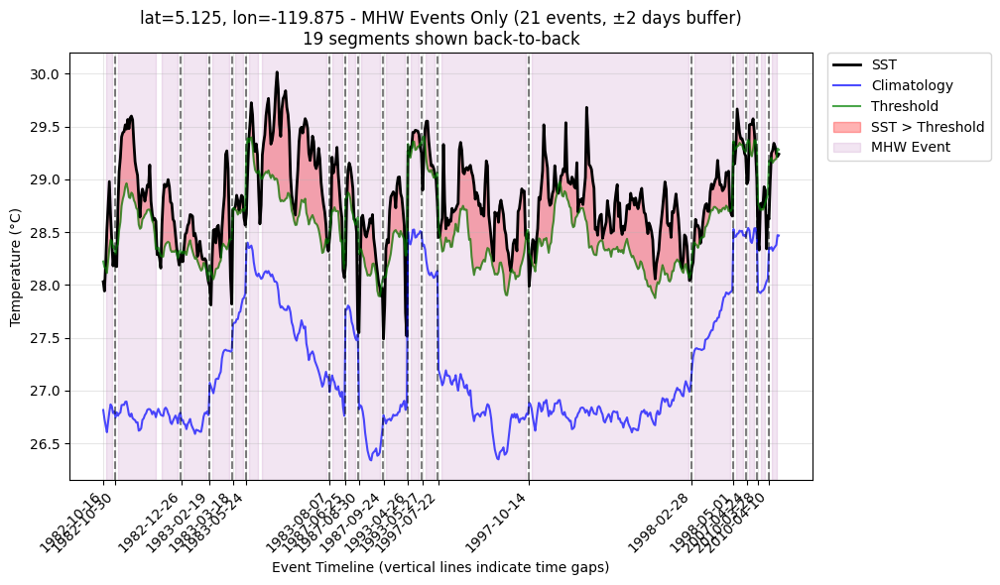

Trimmed to 597 days around 18 MHW events

Displaying 597 days around 18 MHW events:
------------------------------------------------------------
Segment 1: 1982-10-12 to 1982-10-30 (19 days)
Segment 2: 1982-11-02 to 1982-11-19 (18 days)
Segment 3: 1982-11-23 to 1982-12-02 (10 days)
Segment 4: 1982-12-11 to 1982-12-19 (9 days)
Segment 5: 1983-01-21 to 1983-02-10 (21 days)
Segment 6: 1983-02-15 to 1983-04-04 (49 days)
Segment 7: 1983-04-10 to 1983-08-30 (143 days)
Segment 8: 1983-09-08 to 1983-09-25 (18 days)
Segment 9: 1993-03-22 to 1993-03-30 (9 days)
Segment 10: 1997-06-28 to 1998-03-06 (252 days)
Segment 11: 1998-03-31 to 1998-04-13 (14 days)
Segment 12: 1998-05-05 to 1998-05-13 (9 days)
Segment 13: 1998-06-05 to 1998-06-15 (11 days)
Segment 14: 1998-06-17 to 1998-07-01 (15 days)

MHW Events in plot:
✓ Event 1: 1982-10-14 to 1982-10-28 (15 days)
✓ Event 2: 1982-11-04 to 1982-11-08 (5 days)
✓ Event 3: 1982-11-12 to 1982-11-17 (6 days)
✓ Event 4: 1982-11-25 to 1982-11-30 (6 days)
✓ Eve

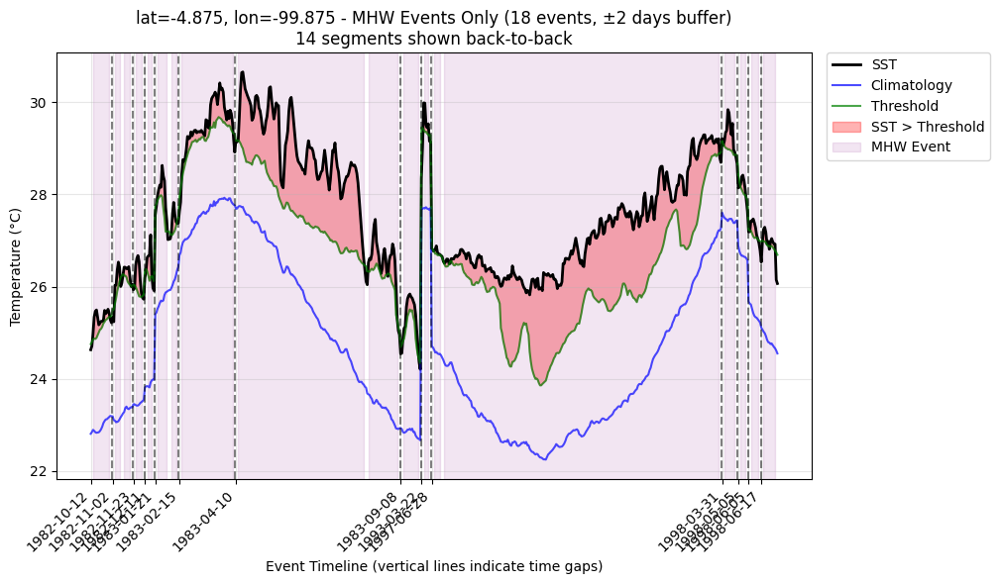

In [26]:
# ============================================
# OSTIA all points
# ============================================

print("PLOTTING ALL POINTS FOR OSTIA (TRIMMED VERSION)")
print("=" * 50)

# Get OSTIA data
data = model_data_mapping['OSTIA']

for point in points_of_interest:
    print(f"\nPlotting {point['name']} (lat={point['lat']}, lon={point['lon']})...")
    
    fig, events_data = plot_sst_trim_mhw_events(
        data['sst'],
        data['ssta'],
        data['thresholds'],
        data['mhw_events'],
        lat=point['lat'],
        lon=point['lon'],
        trim_to_events=True,
        buffer_days=2
    )
    plt.show()

PLOTTING ALL POINTS FOR OSTIA (TRIMMED VERSION)

Plotting Western_EQ_Pacific_1 (lat=0, lon=160)...
Trimmed to 470 days around 32 MHW events

Displaying 470 days around 32 MHW events:
------------------------------------------------------------
Segment 1: 1982-11-29 to 1982-12-15 (17 days)
Segment 2: 1982-12-18 to 1983-01-02 (16 days)
Segment 3: 1983-01-23 to 1983-02-10 (19 days)
Segment 4: 1983-02-16 to 1983-03-01 (14 days)
Segment 5: 1983-05-03 to 1983-05-11 (9 days)
Segment 6: 1984-09-12 to 1984-09-27 (16 days)
Segment 7: 1984-10-05 to 1984-10-30 (26 days)
Segment 8: 1984-11-09 to 1984-11-22 (14 days)
Segment 9: 1985-02-16 to 1985-02-24 (9 days)
Segment 10: 1985-09-23 to 1985-10-02 (10 days)
Segment 11: 1985-10-24 to 1985-11-07 (15 days)
Segment 12: 1985-12-10 to 1985-12-18 (9 days)
Segment 13: 1985-12-29 to 1986-01-22 (25 days)
Segment 14: 1986-06-20 to 1986-07-01 (12 days)
Segment 15: 1999-04-19 to 1999-05-04 (16 days)
Segment 16: 1999-08-29 to 1999-09-11 (14 days)
Segment 17: 2001

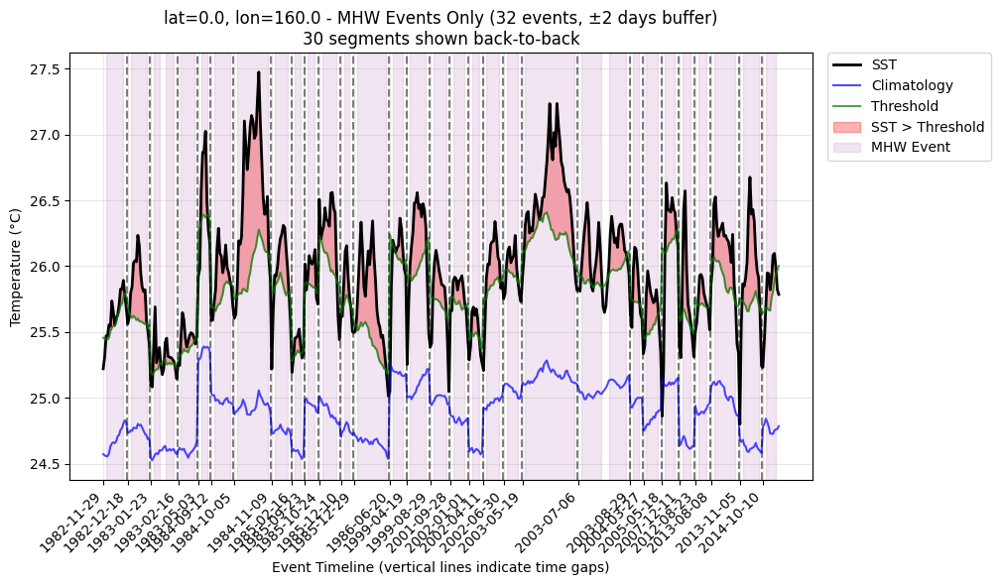


Plotting Western_EQ_Pacific_2 (lat=5, lon=170)...


Task exception was never retrieved
future: <Task finished name='Task-3284249' coro=<Client._gather.<locals>.wait() done, defined at /home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:2394> exception=AllExit()>
Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py", line 2403, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-3284250' coro=<Client._gather.<locals>.wait() done, defined at /home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py:2394> exception=AllExit()>
Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/client.py", line 2403, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-3284251' coro=<Client._gather.<locals>.wait() done, defined at /home/b/b382616/.local/lib/pytho

Trimmed to 475 days around 35 MHW events

Displaying 475 days around 35 MHW events:
------------------------------------------------------------
Segment 1: 1982-12-17 to 1982-12-25 (9 days)
Segment 2: 1983-11-04 to 1983-11-12 (9 days)
Segment 3: 1984-09-04 to 1984-09-17 (14 days)
Segment 4: 1984-09-22 to 1984-10-12 (21 days)
Segment 5: 1984-12-01 to 1984-12-10 (10 days)
Segment 6: 1985-07-31 to 1985-08-18 (19 days)
Segment 7: 1985-08-24 to 1985-09-16 (24 days)
Segment 8: 1985-09-21 to 1985-10-05 (15 days)
Segment 9: 1985-11-06 to 1985-12-07 (32 days)
Segment 10: 1986-05-06 to 1986-05-24 (19 days)
Segment 11: 1986-05-27 to 1986-07-08 (43 days)
Segment 12: 1986-07-12 to 1986-08-06 (26 days)
Segment 13: 1986-08-12 to 1986-08-28 (17 days)
Segment 14: 1987-01-29 to 1987-02-07 (10 days)
Segment 15: 1997-11-14 to 1997-11-28 (15 days)
Segment 16: 1998-01-11 to 1998-01-22 (12 days)
Segment 17: 1998-10-20 to 1998-11-02 (14 days)
Segment 18: 1998-12-06 to 1998-12-18 (13 days)
Segment 19: 1999-01-

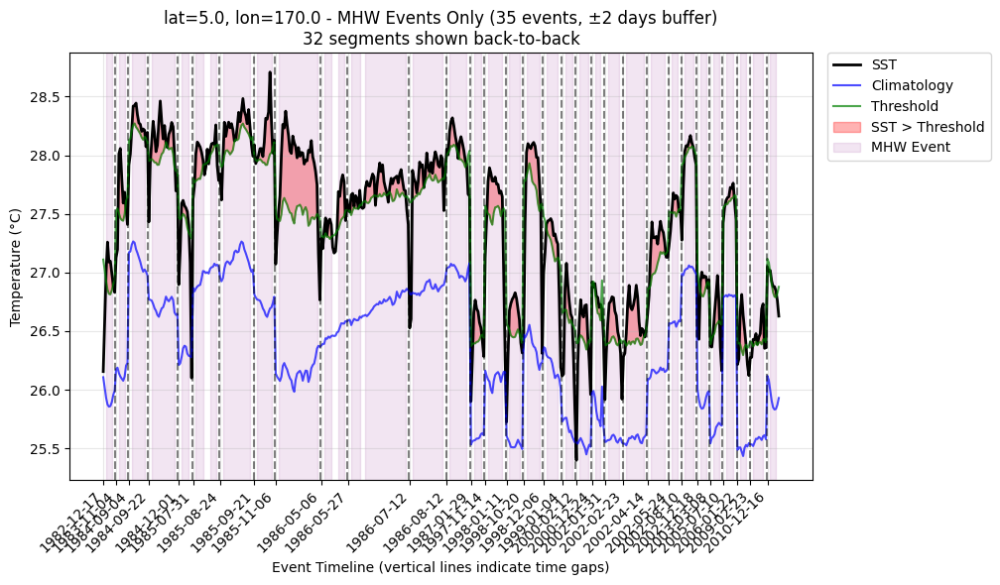


Plotting Western_EQ_Pacific_3 (lat=-5, lon=150)...
Trimmed to 314 days around 22 MHW events

Displaying 314 days around 22 MHW events:
------------------------------------------------------------
Segment 1: 1983-03-03 to 1983-03-31 (29 days)
Segment 2: 1985-11-20 to 1985-12-21 (32 days)
Segment 3: 1986-01-13 to 1986-01-26 (14 days)
Segment 4: 1986-02-14 to 1986-02-28 (15 days)
Segment 5: 1987-05-27 to 1987-06-05 (10 days)
Segment 6: 1997-10-17 to 1997-10-27 (11 days)
Segment 7: 2001-07-27 to 2001-08-21 (26 days)
Segment 8: 2001-09-03 to 2001-09-15 (13 days)
Segment 9: 2001-09-17 to 2001-09-30 (14 days)
Segment 10: 2003-10-06 to 2003-10-28 (23 days)
Segment 11: 2004-02-09 to 2004-02-18 (10 days)
Segment 12: 2004-05-16 to 2004-05-24 (9 days)
Segment 13: 2004-06-04 to 2004-06-19 (16 days)
Segment 14: 2004-06-29 to 2004-07-10 (12 days)
Segment 15: 2011-02-27 to 2011-03-09 (11 days)
Segment 16: 2013-10-03 to 2013-10-13 (11 days)
Segment 17: 2014-05-04 to 2014-05-12 (9 days)
Segment 18: 201

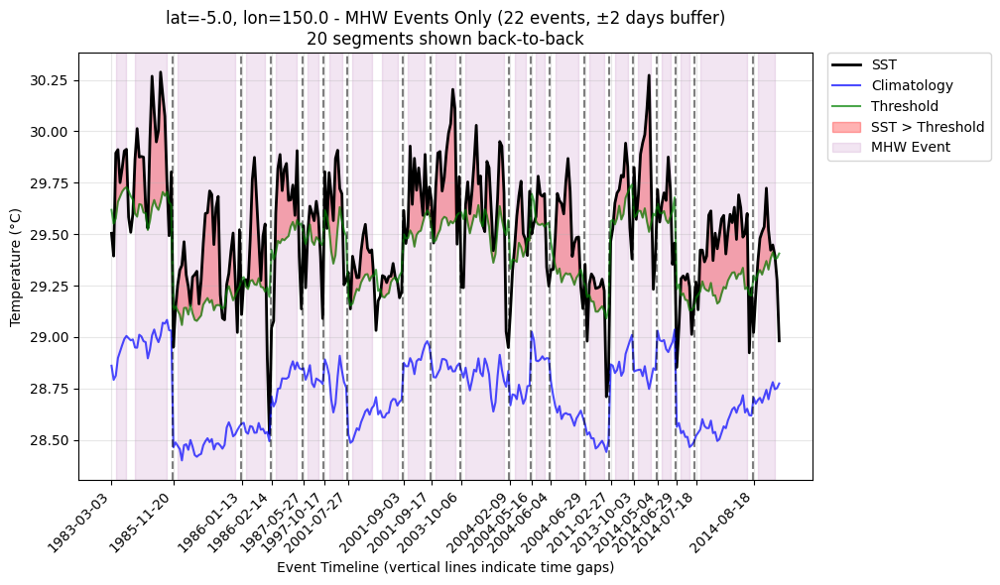


Plotting Eastern_EQ_Pacific_1 (lat=0, lon=-110)...
Trimmed to 490 days around 38 MHW events

Displaying 490 days around 38 MHW events:
------------------------------------------------------------
Segment 1: 1982-03-14 to 1982-03-26 (13 days)
Segment 2: 1982-04-10 to 1982-04-27 (18 days)
Segment 3: 1982-10-05 to 1982-10-16 (12 days)
Segment 4: 1983-01-25 to 1983-02-09 (16 days)
Segment 5: 1984-01-19 to 1984-01-28 (10 days)
Segment 6: 1985-06-02 to 1985-07-11 (40 days)
Segment 7: 1989-07-03 to 1989-07-11 (9 days)
Segment 8: 1989-09-19 to 1989-09-28 (10 days)
Segment 9: 1995-08-23 to 1995-09-02 (11 days)
Segment 10: 1995-09-30 to 1995-10-09 (10 days)
Segment 11: 1995-10-31 to 1995-11-08 (9 days)
Segment 12: 1996-01-15 to 1996-01-23 (9 days)
Segment 13: 1996-11-06 to 1996-11-14 (9 days)
Segment 14: 1997-03-06 to 1997-03-20 (15 days)
Segment 15: 1997-05-01 to 1997-05-12 (12 days)
Segment 16: 1997-08-02 to 1997-08-13 (12 days)
Segment 17: 1998-07-21 to 1998-07-29 (9 days)
Segment 18: 1999-0

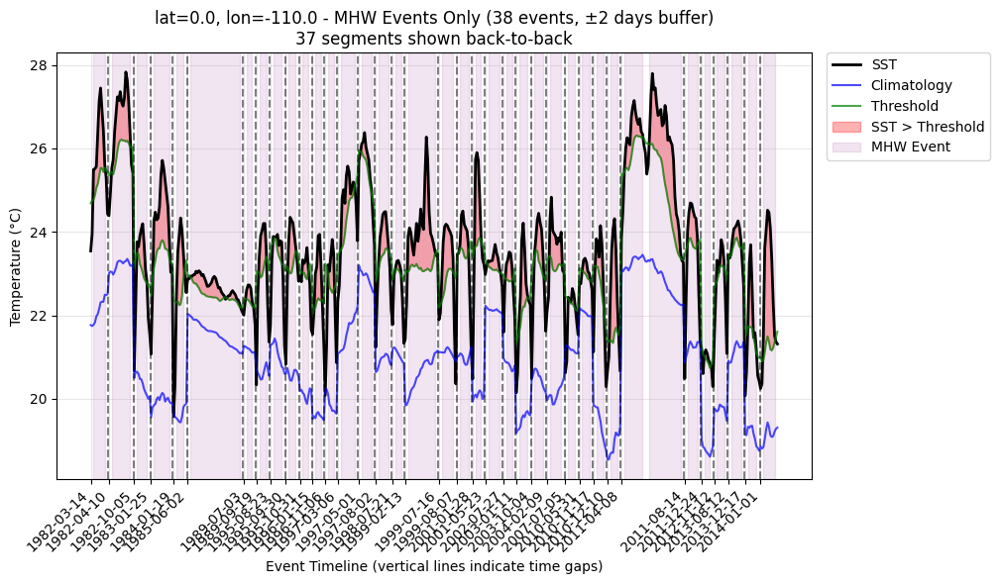


Plotting Eastern_EQ_Pacific_2 (lat=5, lon=-120)...
Trimmed to 585 days around 36 MHW events

Displaying 585 days around 36 MHW events:
------------------------------------------------------------
Segment 1: 1982-06-07 to 1982-06-27 (21 days)
Segment 2: 1982-07-05 to 1982-07-16 (12 days)
Segment 3: 1982-08-01 to 1982-08-11 (11 days)
Segment 4: 1984-09-20 to 1984-10-13 (24 days)
Segment 5: 1984-10-15 to 1984-11-04 (21 days)
Segment 6: 1985-01-13 to 1985-01-24 (12 days)
Segment 7: 1985-03-13 to 1985-03-21 (9 days)
Segment 8: 1985-03-29 to 1985-04-19 (22 days)
Segment 9: 1985-06-23 to 1985-07-04 (12 days)
Segment 10: 1985-07-29 to 1985-08-15 (18 days)
Segment 11: 1985-09-16 to 1985-09-25 (10 days)
Segment 12: 1985-10-01 to 1985-10-11 (11 days)
Segment 13: 1985-11-08 to 1985-11-21 (14 days)
Segment 14: 1985-11-23 to 1985-12-11 (19 days)
Segment 15: 1985-12-17 to 1985-12-29 (13 days)
Segment 16: 1986-01-29 to 1986-02-13 (16 days)
Segment 17: 1987-01-14 to 1987-01-29 (16 days)
Segment 18: 19

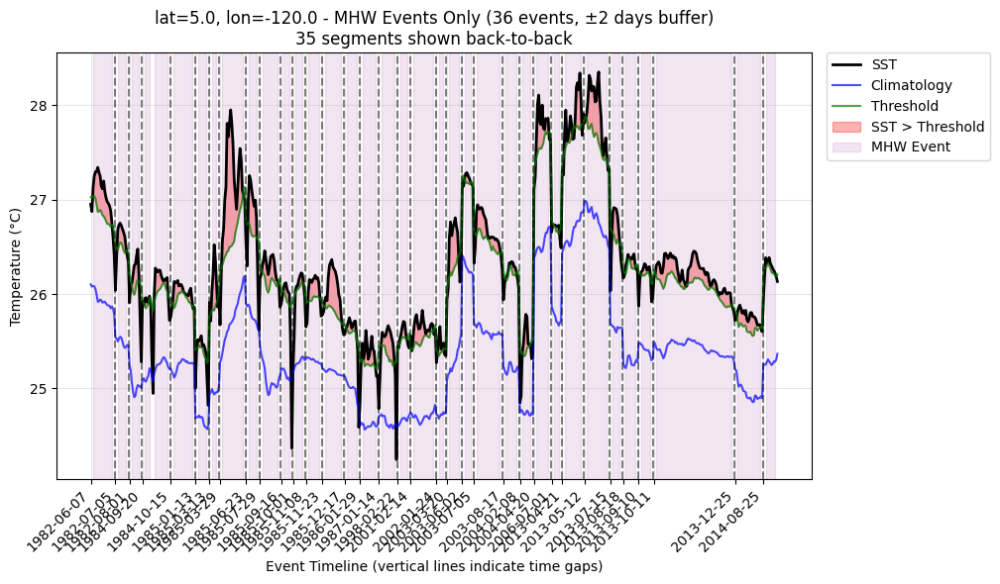


Plotting Eastern_EQ_Pacific_3 (lat=-5, lon=-100)...
Trimmed to 489 days around 30 MHW events

Displaying 489 days around 30 MHW events:
------------------------------------------------------------
Segment 1: 1982-05-08 to 1982-06-12 (36 days)
Segment 2: 1982-10-12 to 1982-10-23 (12 days)
Segment 3: 1984-04-20 to 1984-04-29 (10 days)
Segment 4: 1984-05-16 to 1984-05-24 (9 days)
Segment 5: 1984-08-17 to 1984-08-31 (15 days)
Segment 6: 1985-06-13 to 1985-06-29 (17 days)
Segment 7: 1985-07-09 to 1985-07-18 (10 days)
Segment 8: 1985-07-30 to 1985-08-30 (32 days)
Segment 9: 1985-09-10 to 1985-09-25 (16 days)
Segment 10: 1985-09-27 to 1985-10-09 (13 days)
Segment 11: 1988-06-05 to 1988-06-13 (9 days)
Segment 12: 1989-07-19 to 1989-07-29 (11 days)
Segment 13: 1992-06-11 to 1992-07-01 (21 days)
Segment 14: 1995-11-14 to 1995-12-05 (22 days)
Segment 15: 1998-01-11 to 1998-01-19 (9 days)
Segment 16: 1999-10-27 to 1999-11-06 (11 days)
Segment 17: 2001-08-26 to 2001-09-23 (29 days)
Segment 18: 200

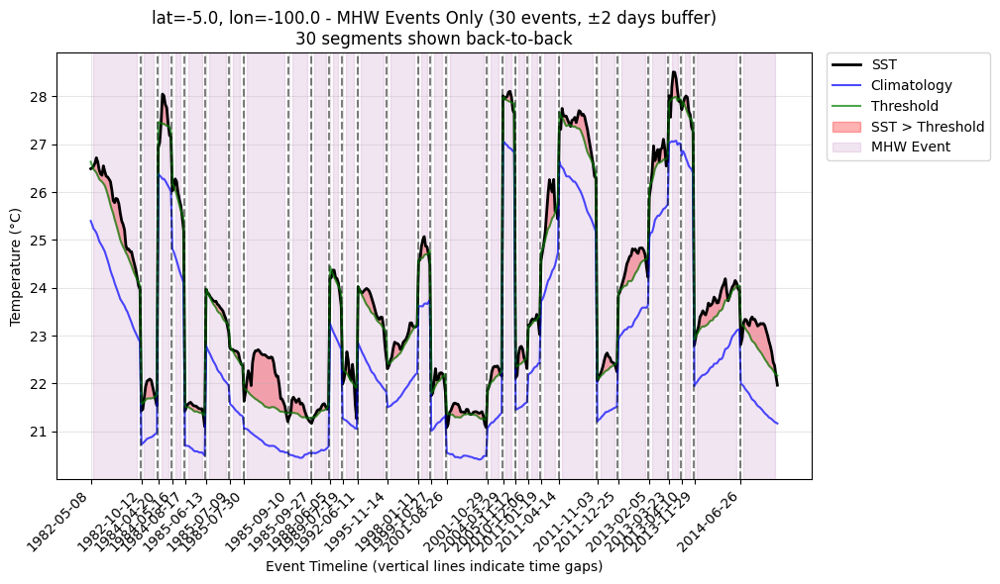

In [30]:
# ============================================
# ICON all points
# ============================================

print("PLOTTING ALL POINTS FOR ICON (TRIMMED VERSION)")
print("=" * 50)

# Get OSTIA data
data = model_data_mapping['ICON']

for point in points_of_interest:
    print(f"\nPlotting {point['name']} (lat={point['lat']}, lon={point['lon']})...")
    
    fig, events_data = plot_sst_trim_mhw_events(
        data['sst'],
        data['ssta'],
        data['thresholds'],
        data['mhw_events'],
        lat=point['lat'],
        lon=point['lon'],
        trim_to_events=True,
        buffer_days=2
    )
    plt.show()

In [24]:
i_ds['thresholds']

<xarray.DataArray 'thresholds' (lat: 481, lon: 1440, dayofyear: 366)> Size: 1GB
dask.array<getitem, shape=(481, 1440, 366), dtype=float32, chunksize=(481, 1440, 46), chunktype=numpy.ndarray>
Coordinates:
  * dayofyear  (dayofyear) uint16 732B 1 2 3 4 5 6 7 ... 361 362 363 364 365 366
  * lat        (lat) float64 4kB -50.0 -49.75 -49.5 -49.25 ... 69.5 69.75 70.0
  * lon        (lon) float64 12kB -180.0 -179.8 -179.5 ... 179.2 179.5 179.8

<xarray.DataArray 'thresholds' (lat: 480, lon: 1440, dayofyear: 366)> Size: 1GB
dask.array<getitem, shape=(480, 1440, 366), dtype=float32, chunksize=(480, 1440, 46), chunktype=numpy.ndarray>
Coordinates:
  * dayofyear  (dayofyear) uint16 732B 1 2 3 4 5 6 7 ... 361 362 363 364 365 366
  * lat        (lat) float32 2kB -49.88 -49.62 -49.38 ... 69.38 69.62 69.88
  * lon        (lon) float32 6kB -179.9 -179.6 -179.4 ... 179.4 179.6 179.9

In [17]:
# ============================================
# IFS-FESOM all points
# ============================================

print("PLOTTING ALL POINTS FOR IFS-FESOM (TRIMMED VERSION)")
print("=" * 50)

# Get OSTIA data
data = model_data_mapping['IFS-FESOM']

for point in points_of_interest:
    print(f"\nPlotting {point['name']} (lat={point['lat']}, lon={point['lon']})...")
    
    fig, events_data = plot_sst_trim_mhw_events(
        data['sst'],
        data['ssta'],
        data['thresholds'],
        data['mhw_events'],
        lat=point['lat'],
        lon=point['lon'],
        trim_to_events=True,
        buffer_days=2
    )
    plt.show()

PLOTTING ALL POINTS FOR IFS-FESOM (TRIMMED VERSION)

Plotting Western_EQ_Pacific_1 (lat=0, lon=160)...
Trimmed to 578 days around 36 MHW events


TypeError: Cannot compare dtypes datetime64[ns] and int64

PLOTTING ALL POINTS WITH MODEL COMPARISONS

POINT 1/6: Western_EQ_Pacific_1 (lat=0, lon=160)


KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7fff08727910> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



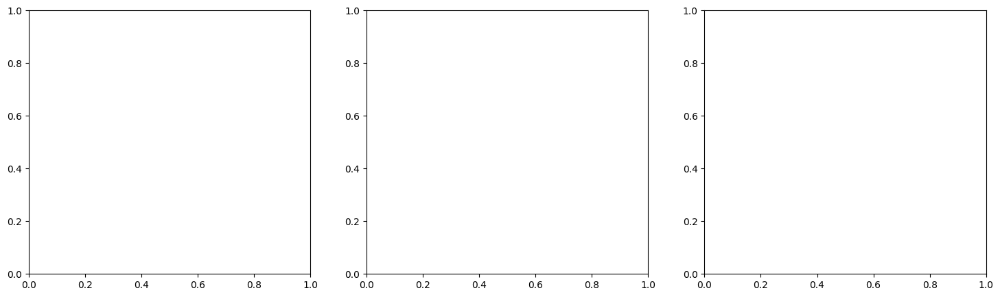

In [36]:


# ============================================
# STEP 3: Plot comparisons for all points
# ============================================

# Option A: Plot all points and show them
summaries = plot_all_points_model_comparisons(
    points_of_interest,
    model_data_mapping,
    buffer_days=5,        # Show 5 days before/after each event
    time_slice=None,      # You can specify a time slice if needed
    save_dir=None         # Optional: directory to save figures
)



PLOTTING WITH TIME SLICE (2015-2020)


In [ ]:

# ============================================
# Custom selection of points
# ============================================

# Select specific points
selected_points = [
    {"name": "Western_EQ_1", "lat": 0, "lon": 160},
    {"name": "Eastern_EQ_1", "lat": 0, "lon": -110},
]

for point in selected_points:
    print(f"\nComparing models at {point['name']}...")
    
    fig, axes, events_data_list = plot_point_model_comparison_subplots(
        point,
        model_data_mapping,
        buffer_days=2,
        figsize=(18, 5)
    )
    plt.show()